In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
import numpy as np
import plotly.express as px
from datetime import datetime as dt
import seaborn as sns
import matplotlib.pyplot as plt
# import my_utils as fx
import re
import plotly.io as pio
from IPython.display import display,HTML
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from collections import *
from plotly.graph_objs import *
import math
from collections import Counter
import os
# Temporary solution for R_HOME error handling
os.environ['R_HOME'] = 'C:/Program Files/R/R-4.2.0'
from scipy.spatial.distance import euclidean
from fastdtw import fastdtw
import matplotlib.cm as cm
from scipy import signal
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import normalize
from tslearn.utils import to_time_series_dataset
from tslearn.neighbors import KNeighborsTimeSeriesClassifier
from sklearn.metrics import accuracy_score
from tensorflow.keras.utils import to_categorical



plotly.offline.init_notebook_mode()
pio.renderers.default = "notebook+pdf"
sns.set(rc = {'figure.figsize':(20,15)})

local = True # False if in Google colab

In [2]:
path = './dataset/preprocessed/'
aggr_datasets, calm_datasets = [], []
for directory, r, files in os.walk(path):
    if directory == './dataset/preprocessed/aggr':
        for file in files:
            dataset = pd.read_csv(filepath_or_buffer=directory+'/'+file, sep=';').drop('Unnamed: 0', axis=1)
            dataset.loc[:,'habit']='A'
            aggr_datasets.append(dataset)
            
    elif directory == './dataset/preprocessed/calm':
        for file in files:
            dataset = pd.read_csv(filepath_or_buffer=directory+'/'+file, sep=';').drop('Unnamed: 0', axis=1)
            dataset.loc[:,'habit']='C' # A for aggressive and C for calm
            calm_datasets.append(dataset)
a1, a2, a3, a4, a5, a6, a7, a8, a9, a10 = tuple(aggr_datasets)
c1, c2, c3, c4, c5, c6, c7, c8, c9, c10 = tuple(calm_datasets)

In [3]:
print("a1", a1)
print("c1", c1)

a1                   device_time       lon        lat  raw_speed_kph  raw_g_x  \
0     2022-05-02 00:11:59.609  5.173754  52.369728              0     0.01   
1     2022-05-02 00:11:59.711  5.173754  52.369728              0     0.02   
2     2022-05-02 00:11:59.814  5.173754  52.369728              0     0.02   
3     2022-05-02 00:11:59.912  5.173754  52.369728              0     0.01   
4     2022-05-02 00:12:00.012  5.173754  52.369728              0     0.01   
...                       ...       ...        ...            ...      ...   
6392  2022-05-02 00:22:38.811  5.173573  52.369812              0     0.02   
6393  2022-05-02 00:22:38.910  5.173573  52.369812              0     0.01   
6394  2022-05-02 00:22:39.013  5.173573  52.369812              0     0.01   
6395  2022-05-02 00:22:39.107  5.173573  52.369812              0     0.01   
6396  2022-05-02 00:22:39.207  5.173573  52.369812              0     0.01   

      raw_g_y   raw_roll   raw_yaw  raw_pitch  raw_g_z    ap

## <center>Percentage-based location segmentation</center>

In [4]:
manoeuvres = ['roundabout_1',
       'roundabout_2', 'roundabout_3', 'roundabout_4', 'turning_right_1',
       'turning_right_2', 'turning_right_3', 'turning_left_1',
       'turning_left_2', 'road_50km_1', 'road_50km_2', 'road_100km',
       'entering_highway', 'exiting_highway', 'speed_bumps',
       # ADDED:
       'road_50km_3','road_50km_4'
    ]

In [5]:
def load_first_idx_manoeuvres(datasets, manoeuvres):
    data = []
    first_idx = 0

    for i, dataset in enumerate(datasets):
        row = []
        for j, m in enumerate(manoeuvres):
            first_idx = dataset[dataset[m]==1].index[0]
            row.append(first_idx)
        # Append the dataset size
        row.append(len(dataset))
        data.append(row)

    res = pd.DataFrame(data)
    res.columns=manoeuvres + ['dataset_size']
    return res
def update_pivot_percental_position(dataset, manoeuvres):
    res = dataset.copy()
    for m in manoeuvres:
        temp=[]
        for i in range(len(dataset)):
            idx, n =  dataset.loc[i, [m, 'dataset_size']]
            temp.append(idx/n*100)
        res[m+'_percental_position'] = temp       
    return res

def load_pivots_based_on_percentage(dataset, percentage_list):
    n = len(dataset)
    res = [int((val*n)/100)/10 for val in percentage_list]
    return res

In [6]:
calm_idxs,  aggr_idxs = load_first_idx_manoeuvres(calm_datasets, manoeuvres), load_first_idx_manoeuvres(aggr_datasets, manoeuvres)
calm_idxs_perc, aggr_idxs_perc = update_pivot_percental_position(calm_idxs, manoeuvres), update_pivot_percental_position(aggr_idxs, manoeuvres)

In [7]:
print("calm_idxs", calm_idxs)
print("aggr_idxs", aggr_idxs)

calm_idxs    roundabout_1  roundabout_2  roundabout_3  roundabout_4  turning_right_1  \
0            75          5600          6100          7300              700   
1           125          5150          5650          6800              750   
2           125          6000          6500          7600              700   
3            75          6000          6493          7550              641   
4            75          6400          6900          8000              700   
5            75          5750          6250          7400              708   
6           125          5600          6150          7600              675   
7            75          5600          6050          7200              700   
8           150          5700          6250          7500              750   
9            75          5550          6050          7150              650   

   turning_right_2  turning_right_3  turning_left_1  turning_left_2  \
0              849             6700            1100         

## <center>Data preparation: Manoeuvrings</center>

<table style='text-align: center'>
    <tr>
        <th>Window nr.</th>
        <th>Description</th>
        <th>Label</th>
    </tr>
    <tr>
        <td>window_1</td>
        <td>roundabout_1</td>
        <td>1</td>
    </tr>
    <tr>
        <td>window_2</td>
        <td>speed_bumps</td>
        <td>2</td>
    </tr>
    <tr>
        <td>window_3</td>
        <td>turning_right_1</td>
        <td>3</td>
    </tr>
    <tr>
        <td>window_4</td>
        <td>turning_right_2</td>
        <td>3</td>
    </tr>
    <tr>
        <td>window_5</td>
        <td>turning_left_1</td>
        <td>4</td>
    </tr>
    <tr>
        <td>window_6</td>
        <td>road_50km_1</td>
        <td>5</td>
    </tr>
    <tr>
        <td>window_7</td>
        <td>entering_highway</td>
        <td>7</td>
    </tr>
    <tr>
        <td>window_8</td>
        <td>road_100km</td>
        <td>6</td>
    </tr>
    <tr>
        <td>window_9</td>
        <td>exiting_highway</td>
        <td>8</td>
    </tr>
    <tr>
        <td>window_10</td>
        <td>road_50km_2</td>
        <td>5</td>
    </tr>
    <tr>
        <td>window_11</td>
        <td>turning_left_2</td>
        <td>4</td>
    </tr>
    <tr>
        <td>window_12</td>
        <td>roundabout_2</td>
        <td>1</td>
    </tr>
    <tr>
        <td>window_13</td>
        <td>roundabout_3</td>
        <td>1</td>
    </tr>
    <tr>
        <td>window_14</td>
        <td>turning_right_3</td>
        <td>3</td>
    </tr>
    <tr>
        <td>window_15</td>
        <td>roundabout_4</td>
        <td>1</td>
    </tr>
</table>
<center><b>Table 1.</b> Information on classes for each manoeuvre</center>

In [8]:
def perpare_ts_dataset_per_window_manoeuvres(dataset):
    # col = dataset.columns[:15]
    # ADDED extra 50km:
    col = dataset.columns[:16]
    df_window = dataset[col]
    df_transposed_window = df_window.T
    df_transposed_window.columns = ['trip_{}'.format(i+1) for i in range(20)]
    # label = [1,2,3,3,4,5,7,6,8,5,4,1,1,3,1]
    # ADDED extra two 50km:
    label = [1,2,3,3,4,5,7,6,8,5,4,1,1,3,1,5,5]
    return df_transposed_window, label
def preprocess_ts_dataset_per_window_manoeuvres(calm, aggr, feat, aggr_percentage_location,\
                                  calm_percentage_location, res_column):
    num_windows = len(res_column)
    idxs, window = None, None
    info = []
    for soonseo, datasets in enumerate([calm, aggr]):
#         print(soonseo)
        for dataset in datasets:
            n = len(dataset)
            if soonseo == 0: # Calm
                idxs = [int((val * n)/100) for val in calm_percentage_location]
            else: # Aggr
                idxs = [int((val * n)/100) for val in aggr_percentage_location]
            idxs.sort()
#             print(idxs)
            head, tail = 0, 0
            row = []
            for i, idx in enumerate(idxs):
                if i == len(idxs) - 1:
                    # At end
                    window = list(dataset.loc[idx:len(dataset)-1, feat])
                else:
                    if i == 0:
                        tail = idx
                    else:
                        head, tail = idxs[i-1]+1, idx
                    window = list(dataset.loc[head:tail, feat])
                row.append(window)
            
            row.append(soonseo)
            info.append(row)
                
    
    res = pd.DataFrame(info, columns = res_column)
    
    return res

In [9]:
# col = ['window_'+str(num+1) for num in range(15)] 
# ADDED extra 50km:
col = ['window_'+str(num+1) for num in range(17)] 
col.append('Label')
# ts_dataset_manoeuvres = preprocess_ts_dataset_per_window_manoeuvres(calm_datasets, aggr_datasets, 'yaw',  aggr_idxs_perc.mean()[16:], calm_idxs_perc.mean()[16:], col)
# ADDED extra 50km:
ts_dataset_manoeuvres = preprocess_ts_dataset_per_window_manoeuvres(calm_datasets, aggr_datasets, 'yaw',  aggr_idxs_perc.mean()[18:], calm_idxs_perc.mean()[18:], col)
ts_dataset_manoeuvre, label_manoeuvre = perpare_ts_dataset_per_window_manoeuvres(ts_dataset_manoeuvres)

In [10]:
print("col", col)
print("ts_dataset_manoeuvre", ts_dataset_manoeuvre)
print("label_manoeuvre", label_manoeuvre)

col ['window_1', 'window_2', 'window_3', 'window_4', 'window_5', 'window_6', 'window_7', 'window_8', 'window_9', 'window_10', 'window_11', 'window_12', 'window_13', 'window_14', 'window_15', 'window_16', 'window_17', 'Label']
ts_dataset_manoeuvre                                                       trip_1  \
window_1   [0.11013664, 0.1414902333333333, 0.12565240685...   
window_2   [0.3525865842987759, 0.3179185548083795, 0.251...   
window_3   [0.0358580610432297, -0.0111516935973773, 0.00...   
window_4   [0.0287648504734514, 0.0446510777031376, -0.03...   
window_5   [0.0547192143688913, -0.0044529342100988, -0.0...   
window_6   [1.093795340465404, 1.165876544968549, 1.27341...   
window_7   [0.3206712260065159, 0.3592119772786509, 0.441...   
window_8   [-0.0908806229445325, -0.0871896363132114, -0....   
window_9   [2.0927849599881334, 2.0429233481710307, 2.001...   
window_10  [-0.5431409486728584, -0.530331604248053, -0.4...   
window_11  [-0.0177934342711742, -0.0089930247919

In [11]:
np.shape(ts_dataset_manoeuvre)
len(ts_dataset_manoeuvre.loc['window_2', 'trip_1'])

171

## <center>Data preparation: Aggressiveness</center>

In [12]:
def find_peaks(values, t_pad, d_pad, num_windows):
    """
    Ref: Ma, et al.: Time Series Peak Selection Algorithm (Segmentation of Time Series in Improving DTW) 
    Inputs
        t: The minimum threshold on the frequency domain below which all peaks are ignored.
        d: The minimum radius from a selected peak within which all other peaks are ignored.
        n: The maximum number of peaks to be detected.
    Outputs
        significant_peaks: The list of peaks with both their indices and values
        
        
        noise_band = 1.1
top_noise = temp.yaw.mean() + 0.5
bottom_noise = temp.yaw.mean() - 0.5
    """
    significant_peaks, peaks, candidates, indices = [], [], [], []
    t = values.mean() + t_pad
    d, d_start, d_end = d_pad, 0, 0 # 5 second to filter out, samples = 10Hz == 10 samples per second
    C = list(values)
    n = num_windows # Trying different numbers
    index_check, temp_c, temp_j, sets_to_filter = False, None, None, set()
    # values == a1.g_z for example
    
    # Select candidates: i is equivalent to dataset indices
    for i, c_i in enumerate(C):
        if i == 0:
            continue
        elif i == len(C)-1:
            if (c_i > C[i-1]):
                candidates.append((i, c_i))
            break
        
        if (c_i > C[i-1]) and (c_i > C[i+1]):
            candidates.append((i, c_i))
        
    # Sort by values (The biggest to smallest c)
    candidates.sort(key=lambda c : c[1], reverse=True)
    
    # Filter peaks by comparing threshold t 
    peaks = [(i, c_i) for i, c_i in candidates if c_i > t]

#     print(peaks)
    
    # Filter out indices in peaks using d value
    val_to_pop = []
    lists_to_pop = []
    counter = 0
    temp_peaks = []
    for i, c in peaks:
        for j in [x for x in np.arange(i-d, i+d, 1) if x != i]:
            val_to_pop = [(x,y) for x,y in peaks if x == j]
            if len(val_to_pop) != 0:
                lists_to_pop.append(val_to_pop[0])
        """
            After appending all tuple elements in the list, pick the highest c_i
        """
        if len(lists_to_pop) != 0:
            lists_to_pop.sort(key=lambda c_i : c_i[1], reverse=False)
            for elem in lists_to_pop:
                peaks.pop(peaks.index(elem))
        lists_to_pop=[]
    
    
    if n > len(peaks):
        n = len(peaks)
    
    significant_peaks = peaks[0:n]
    
    return significant_peaks

In [13]:
def rate_of_change(val, t):
    res = []
    # time and velocity
    counter_t, counter_val, a = 0, 0, 0.0
    
    while counter_val != len(val):
    
        if counter_t == 0 and counter_val == 0:
            res.append(0)
        else:
            a = (val[counter_val] - val[counter_val-1])/(t[counter_t] - t[counter_t-1])
            res.append(a)

        counter_val += 1
        counter_t += 1
    
    return res
def update_dataset(datasets, function, feat, updated_feat):
    res = []
    
    if type(feat) == str:
        if feat == 'speed_kph':
            for dataset in datasets:
                dataset.loc[:,updated_feat] = function(dataset[feat], dataset['cumulative_time'])
                dataset.loc[:,'ewm_'+updated_feat[4:]] = dataset[updated_feat].ewm(com=30, adjust=True).mean()
                res.append(dataset)    
    else:
        # Update peaks
        if updated_feat == 'peaks':
            col, t, d, n = feat
            for dataset in datasets:
                # E.g. col == ewm_tAcc 
                peaks_idx = [i/10 for i, x in find_peaks(dataset[col],t_pad=t, d_pad=d, num_windows=n)]
                dataset.loc[:,updated_feat] = [0 if x/10 not in peaks_idx else 1 for x in np.arange(0,len(dataset))]
                res.append(dataset)
            
    return res
def plot_measured_acceleration(dataset):
    fig = make_subplots(specs=[[{"secondary_y":True}]])

    fig.add_trace(
        go.Scatter(x=np.arange(0,len(dataset),0.1), y=dataset.raw_speed_kph, line_color='orange', name="velocity"),
        secondary_y=False
    )
    fig.add_trace(
        go.Scatter(x=np.arange(0,len(dataset),0.1), y=dataset.yaw, line_color='blue', name="yaw"),
        secondary_y=True
    )

    noise_band = 1.1
    top_noise = dataset.ewm_tAcc.mean() + 0.65
    bottom_noise = dataset.ewm_tAcc.mean() - 0.65

    fig.add_hline(y=dataset.ewm_tAcc.mean(), line_color = 'gray',line_dash="dash", secondary_y=True)
    fig.add_hline(y=top_noise, line_color = 'red',line_dash="dash", secondary_y=True)
    fig.add_hline(y=bottom_noise, line_color = 'red',line_dash="dash", secondary_y=True)
    fig.add_hrect(y0=top_noise, y1=bottom_noise, line_width=0, fillcolor='black', opacity=0.2, secondary_y=True)

    fig.update_yaxes(title_text="<b>Velocity</b>", secondary_y=False)
    fig.update_yaxes(title_text="<b>Yaw</b>", secondary_y=True)

    fig.update_layout(plot_bgcolor="white")

    fig.show()
    
def prepare_ts_dataset_per_window(calm, aggr, num_windows, feat):
    n = num_windows
# E.g. of feat == yaw inertial sensors, etc.
    info = []
    
    for soonseo, datasets in enumerate([calm, aggr]):
        for dataset in datasets:
            idx_list, start, row, window = [], 0, [], None
            
            # Get indices to seperate windows
            for idx in dataset[dataset['peaks']==1].index:
                end = idx
                idx_list.append((start, end))
                start = idx + 1

            for i, (start, end) in enumerate(idx_list):
                # a window == a group of time series as one instance in dataset.
                window = list(dataset.loc[start:end, feat])
                row.append( window )
            
            # 0 == Calm. 1 == Aggressive
            if soonseo == 0:
                row.append(0)
            else:
                row.append(1)
                
            info.append(row)
            row = []
        
    
    res_col = ["window_"+str(x+1) for x in np.arange(0,n,1)]
    res_col.append('label')
    res = pd.DataFrame(data=info, columns=res_col)
    
    return res

## <center>Partition each dataset into 70% train 30% test sets</center>

In [14]:
def permutate_xy_trainings(train_x, train_y):
    permutated_train_x, permutated_train_y = None, None 
    idx = np.random.permutation(len(train_x))
    permutated_train_x, permutated_train_y = train_x[idx], train_y[idx]
    return permutated_train_x, permutated_train_y

def load_training_test_for_aggressiveness(tuple_of_trips):
    train_x, train_y, test_x, test_y = [], [], [], []
    aggr_datasets, calm_datasets = tuple_of_trips
    
    aggr_datasets = tuple(update_dataset(datasets=aggr_datasets, function=find_peaks, feat=('yaw', 0.65, 100, 10), updated_feat='peaks'))
    calm_datasets = tuple(update_dataset(datasets=calm_datasets, function=find_peaks, feat=('yaw', 0.65, 100, 10), updated_feat='peaks'))    
    dataset = prepare_ts_dataset_per_window(calm_datasets, aggr_datasets, 10, 'yaw')
    
    window_list = [x for x in dataset.columns if x != 'label']
    
    for i in np.arange(0,len(dataset), 1):
        for window in window_list:
            if i in np.arange(0,10,1):
                # Calm manoeuvres
                if i not in [7,8,9]:
                    # Training
                    train_x.append(list(dataset.loc[i, window]))
                    train_y.append(0)
                else:
                    # Test
                    test_x.append(list(dataset.loc[i, window]))
                    test_y.append(0)
            else:
                # Aggressive manoeuvres
                if i not in [17,18,19]:
                    train_x.append(list(dataset.loc[i, window]))
                    train_y.append(1)
                else:
                    test_x.append(list(dataset.loc[i, window]))
                    test_y.append(1)
                    
    
    padded_train_x = pad_sequences(train_x, dtype='float32', padding='post')
    padded_test_x = pad_sequences(test_x, dtype='float32', padding='post')
    scaled_train_y = np.array(train_y, dtype='int')
    scaled_test_y = np.array(test_y, dtype='int')
    
    
    # normalizing based on time series data dataset.shape == tuple(axis=0, axis=1)
#     normal_train_x, normal_test_x = normalize(padded_train_x,axis=1), normalize(padded_test_x,axis=1)
    # Shuffle
    permutated_train_x, permutated_train_y = permutate_xy_trainings(padded_train_x, scaled_train_y)
    # Transform
    train_X = to_time_series_dataset(permutated_train_x)
    
    return train_X, permutated_train_y, padded_test_x, scaled_test_y
    

def load_training_test_for_manoeuvres(dataset, label):
    train_x, train_y, test_x, test_y = [], [], [], []
    for label_index, idx in enumerate(dataset.index):
        for i, val in enumerate(dataset.loc[idx]):
            # Append window and label in train x and y.
            # 14 windows for training and 6 windows for testing (Aggr and calm)
            if i not in [7, 8, 9, 17, 18, 19]:
                train_x.append(val)
                train_y.append(label[label_index])
            else:
                test_x.append(val)
                test_y.append(label[label_index])
    # Apply padding
    padded_train_x = pad_sequences(train_x, dtype='float32', padding='post')
    padded_test_x = pad_sequences(test_x, dtype='float32', padding='post')
    scaled_train_y = np.array(train_y, dtype='int')
    scaled_test_y = np.array(test_y, dtype='int')
    # Shuffle training set
    permutated_train_x, permutated_train_y = permutate_xy_trainings(padded_train_x, scaled_train_y)
    # Transform dataset to time series dataset
    train_X = to_time_series_dataset(permutated_train_x)
    return train_X, permutated_train_y, padded_test_x, scaled_test_y

## <center>Build model and classify the driving</center> 

In [15]:
from os.path import exists as file_exists

In [16]:
def build_ts_classifier_models(manoeuvre_dataset, manoeuvre_classes, tuple_of_trips):
    # Build a classfier that approximates 
    # manoeuvre_classifier, aggressiveness_classifier
    # from_hdf5, to_hdf5: Model's file extension
#     manoeuvre_classifer_model = KNeighborsTimeSeriesClassifier(n_neighbors=2, metric='dtw', verbose=100)
    # If the model exists, load the model, else build model.
    manoeuvre_model_exist, aggressiveness_model_exist = file_exists('./trained_models/manoeuvres.hdf5'), file_exists('./trained_models/aggressiveness.hdf5')
    
    if manoeuvre_model_exist != True:
        # 1. Prepare train_x, train_y, test_x, test_y
        # 2. Train the model using fit.
        # 3. After the teaching is done, store the state of the model into trained_models directory. "./trained_models/manoeuvres.hdf5"
        train_x, train_y, test_x, test_y = load_training_test_for_manoeuvres(manoeuvre_dataset, manoeuvre_classes)
        print('Manoeuvring classfier: Train and test sets are ready')
        # Make model
        manoeuvre_classifer_model = KNeighborsTimeSeriesClassifier(n_neighbors=2, metric='dtw', verbose=100)
        """n_neighbor=2"""
        predicted_labels = manoeuvre_classifer_model.fit(X=train_x, y=list(train_y)).predict(test_x)
        score = accuracy_score(list(test_y), list(predicted_labels))
        print("""Driving behaviour classification accuracy score of manoeuvring= {}""".format(score))
       
        if not os.path.exists('./trained_models'):
            os.makedirs("./trained_models/")
        manoeuvre_classifer_model.to_hdf5("./trained_models/manoeuvres.hdf5")
        manoeuvre_classifer_model = KNeighborsTimeSeriesClassifier.from_hdf5('./trained_models/manoeuvres.hdf5')
    else:
        # no need for teaching
        manoeuvre_classifer_model = KNeighborsTimeSeriesClassifier.from_hdf5('./trained_models/manoeuvres.hdf5')
        
    if aggressiveness_model_exist != True:
        # 1. Prepare train_x, train_y,  test_x, test_y
        # 2. Train the model using fit as well.
        # 3. After the teaching is done, store the state of the model into trained_models directory './trained_models/aggressiveness.hdf5'
        # ts_dataset = perpare_ts_dataset_per_window_aggressiveness(calm_datasets, aggr_datasets, 'yaw',  aggr_idxs_perc.mean()[16:], calm_idxs_perc.mean()[16:], col)
        train_x, train_y, test_x, test_y = load_training_test_for_aggressiveness(tuple_of_trips)
        print('Aggressiveness classfier: Train and test sets are ready')
        # Make model
        aggressiveness_classifer_model = KNeighborsTimeSeriesClassifier(n_neighbors=5, metric='dtw', verbose=100)
        """n_neighbor=5"""
        predicted_labels = aggressiveness_classifer_model.fit(X=train_x, y=list(train_y)).predict(test_x)
        score = accuracy_score(list(test_y), list(predicted_labels))
        print("""Driving behaviour classification accuracy score of aggressiveness detection = {}""".format(score))
        if not os.path.exists('./trained_models'):
            os.makedirs("./trained_models/")
        aggressiveness_classifer_model.to_hdf5("./trained_models/aggressiveness.hdf5")
        aggressiveness_classifer_model = KNeighborsTimeSeriesClassifier.from_hdf5('./trained_models/aggressiveness.hdf5')

    else:
        # no need for teaching. just load_hdf5
        aggressiveness_classifer_model = KNeighborsTimeSeriesClassifier.from_hdf5('./trained_models/aggressiveness.hdf5')
        
    
    return manoeuvre_classifer_model, aggressiveness_classifer_model

In [17]:
manoeuvre_classifier_model, aggressiveness_classifier_model = build_ts_classifier_models(ts_dataset_manoeuvre, label_manoeuvre, (aggr_datasets, calm_datasets))

In [18]:
# Using fixed segment lengths:
#   
# Manoeuvring classfier: Train and test sets are ready
# Driving behaviour classification accuracy score of manoeuvring= 0.8222222222222222
# Aggressiveness classfier: Train and test sets are ready
# Driving behaviour classification accuracy score of aggressiveness detection = 0.7833333333333333

In [19]:
manoeuvre_classifier_model

KNeighborsTimeSeriesClassifier(n_neighbors=2, verbose=100)

In [20]:
def segment_new_trip(trip, ver, aggrs, calms, percental_pivoting):
    trip_length = len(trip)
    res = []
    if ver == 'a':
        # Aggressiveness
        peaks_idx = [i/10 for i, x in find_peaks(trip['yaw'], 0.65, 100, 10)]
        trip.loc[:,'peaks'] = [0 if x/10 not in peaks_idx else 1 for x in np.arange(0,len(trip))]
        # Process the data into Pandas DataFrame
        n = 10 # number of windows for aggressiveness check
        info = []
        idx_list, start, res, window = [], 0, [], None
        for idx in trip[trip['peaks']==1].index:
#             print(start, idx)
            end = idx
            idx_list.append((start,end))
            start = idx+1
        
        for (start, end) in idx_list:
#             print('yes')
            window = list(trip.loc[start:end, 'yaw'])
            res.append(window)

        
        padded_train_x = pad_sequences(res, dtype='float32', padding='post')
        res = to_time_series_dataset(padded_train_x)
    
    else:
        # Manoeuvring
        counter_a, counter_c = 0, 0
        for aggr in aggrs:
            counter_a += len(aggr)
        avg_aggr_dataset_size = counter_a/len(aggrs)
        for calm in calms:
            counter_c += len(calm)
        avg_calm_dataset_size = counter_c/len(calms)
        
        if trip_length <= (avg_aggr_dataset_size + avg_calm_dataset_size)/2:
            idxs = [int((val * trip_length)/100) for val in percental_pivoting[0]]
        else:
            idxs = [int((val * trip_length)/100) for val in percental_pivoting[1]]
        idxs.sort()
        idx_list = idxs
        head, tail = 0, 0
        temp = []
        for i, idx in enumerate(idxs):
            if i == len(idxs) - 1:
                # At end
                window = list(trip.loc[idx:len(trip)-1, 'yaw'])
            else:
                if i == 0:
                    tail = idx
                else:
                    head, tail = idxs[i-1]+1, idx
                window = list(trip.loc[head:tail, 'yaw'])
            temp.append(window)
            
        padded_train_x = pad_sequences(temp, dtype='float32', padding='post')
        res = to_time_series_dataset(padded_train_x)
        
    return res, idx_list

In [21]:
def classify_and_report(taught_models, aggrs, calms, percental_pivoting, trip):
    # Models taken as a parameter is a tuple of models which were taught with trained set.
    # Trip is the one that is going to be tested in which window is classified as an aggresssive 
    # movement.
    
    manoeuvre_classifier_model, aggressiveness_classifier_model = taught_models
        
    aggressiveness_trip_sample, idx_list_a = segment_new_trip(trip,'a', aggrs, calms, percental_pivoting)
    manoeuvring_trip_sample, idx_list_m = segment_new_trip(trip, 'm', aggrs, calms, percental_pivoting)
    predicted_aggressiveness = aggressiveness_classifier_model.predict(aggressiveness_trip_sample)
    predicted_manoeuvre = manoeuvre_classifier_model.predict(manoeuvring_trip_sample)
    
    classified_aggressiveness, classified_manoeuvres= [], []
    
    for i, (start, end) in enumerate(idx_list_a):
        predicted_val = predicted_aggressiveness[i]
        for j in np.arange(start, end+1, 1):
            classified_aggressiveness.append(predicted_val)
        
    while len(classified_aggressiveness) != len(trip):
        classified_aggressiveness.append(None)
    
    
    idx_list = []
    head, tail = 0, 0
    for i, idx in enumerate(idx_list_m):
        if i == len(idx_list_m) - 1:
            # At end
            window = list(trip.loc[idx:len(trip)-1, 'yaw'])
        else:
            if i == 0:
                tail = idx
            else:
                head, tail = idx_list_m[i-1]+1, idx
            window = list(trip.loc[head:tail, 'yaw'])
        idx_list.append((head, tail))
    for i, (start, end) in enumerate(idx_list):
        predicted_val = predicted_manoeuvre[i]
        if i == 0:
            print(i, start)
            for j in np.arange(start, end+1, 1):
                classified_manoeuvres.append(None)
        for j in np.arange(start, end+1, 1):
            classified_manoeuvres.append(predicted_val)
        
    while len(classified_manoeuvres) != len(trip):
        classified_manoeuvres.append(None)
    
    
    
    print(predicted_aggressiveness, classified_aggressiveness, predicted_manoeuvre, classified_manoeuvres)
    
    
    return (predicted_aggressiveness, predicted_manoeuvre), classified_aggressiveness, classified_manoeuvres

In [22]:
def load_samples(sample_path):
    sample = pd.read_csv(sample_path)
    feature_to_rename = {' G(y)': 'raw_yaw'}
    sample.rename(columns = feature_to_rename,inplace=True)
    sample.loc[:,'yaw'] = [x for x in sample['raw_yaw'].ewm(com=10).mean()]
    return sample

In [23]:
sample_1 = load_samples("./dataset/samples/Sample_1.csv")
sample_2 = load_samples("./dataset/samples/Sample_2.csv")

In [24]:
# cols = aggr_idxs_perc.columns[16:]
# ADDED extra 50km
cols = aggr_idxs_perc.columns[18:]
(predicted_aggressiveness, predicted_manoeuvre), sample_1.loc[:,'predicted_aggressiveness'], sample_1.loc[:,'predicted_manoeuvres']  = classify_and_report((manoeuvre_classifier_model, aggressiveness_classifier_model), aggr_datasets, calm_datasets, (list(aggr_idxs_perc[cols].mean()), list(calm_idxs_perc[cols].mean())), sample_1)

0 0
[0 0 0 0 0 0 0 0 0 0] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [25]:
# cols = aggr_idxs_perc.columns[16:]
# ADDED extra 50km
cols = aggr_idxs_perc.columns[18:]
(predicted_aggressiveness, predicted_manoeuvre), sample_2.loc[:,'predicted_aggressiveness'], sample_2.loc[:,'predicted_manoeuvres'] = classify_and_report((manoeuvre_classifier_model, aggressiveness_classifier_model), aggr_datasets, calm_datasets, (list(aggr_idxs_perc[cols].mean()), list(calm_idxs_perc[cols].mean())), sample_2)

0 0
[0 0 0 1 1 0 0 0 0 0] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

## <center>Visualize the classification result</center>

In [26]:
filter_m = {-9999:'Unknown', 1:'Roundabout',2:'Speed bumps',3:'Turning Left',4:'Turning Right',5:'50km Road',6:'100km Road',7:'Entering highway',8:'Exiting highway'}
filter_a = {0:'Calm', 1:'Aggressive', -9999:'Unknown'}

sample_1.loc[:,'Predicts'] = np.array([(filter_m[val[0]], filter_a[val[1]]) if np.isnan(val[0]) == False and np.isnan(val[1]) == False else -9999 for val in zip(sample_1['predicted_manoeuvres'], sample_1['predicted_aggressiveness'])], dtype='object')
sample_2.loc[:,'Predicts'] = np.array([(filter_m[val[0]], filter_a[val[1]]) if np.isnan(val[0]) == False and np.isnan(val[1]) == False else -9999 for val in zip(sample_2['predicted_manoeuvres'], sample_2['predicted_aggressiveness'])], dtype='object')

In [27]:
fig = px.scatter_mapbox(sample_1[[' Latitude', ' Longitude', 'Predicts']], lat=' Latitude', lon=' Longitude', hover_name='Predicts', color='Predicts', zoom=12, height=500)
fig.update_layout(
    mapbox_style='carto-positron'
)
fig.show()

In [28]:
fig = px.scatter_mapbox(sample_2, lat=' Latitude', lon=' Longitude', hover_name='Predicts', color='Predicts', zoom=12, height=500)
fig.update_layout(
    mapbox_style='carto-positron'
)
fig.show()

In [29]:
calm_idxs,  aggr_idxs = load_first_idx_manoeuvres(calm_datasets, manoeuvres), load_first_idx_manoeuvres(aggr_datasets, manoeuvres)
print("calm_idxs", calm_idxs)
print("aggr_idxs", aggr_idxs)

calm_idxs    roundabout_1  roundabout_2  roundabout_3  roundabout_4  turning_right_1  \
0            75          5600          6100          7300              700   
1           125          5150          5650          6800              750   
2           125          6000          6500          7600              700   
3            75          6000          6493          7550              641   
4            75          6400          6900          8000              700   
5            75          5750          6250          7400              708   
6           125          5600          6150          7600              675   
7            75          5600          6050          7200              700   
8           150          5700          6250          7500              750   
9            75          5550          6050          7150              650   

   turning_right_2  turning_right_3  turning_left_1  turning_left_2  \
0              849             6700            1100         

## <center>Convolutional LSTM many-to-one</center>

### Aggressive classifier

In [30]:
event_to_class_map   = [2,1,2,2,3, 4,6,5,7,4, 3,0,0,2,0, 4,4]
# class_to_event_map = ['roundabout','speedbumps','turning_right','turning_left',\
#                       'road_50km','road_100km','entering_highway',exiting_highway']
# a bit shorter so the confusion matrix is more readble:
class_to_event_map = ['round','bumps','right','left',\
                      '50km','100km','enter','exit']
event_id_to_name_map = ['roundabout_1','speed_bumps','turning_right_1','turning_right_2','turning_left_1',  \
                        'road_50km_1','entering_highway','road_100km','exiting_highway','road_50km_2',  \
                        'turning_left_2','roundabout_2','roundabout_3','turning_right_3','roundabout_4']
# ADDED extr 50km:
event_id_to_name_map = ['roundabout_1','speed_bumps','turning_right_1','turning_right_2','turning_left_1',  \
                        'road_50km_1','entering_highway','road_100km','exiting_highway','road_50km_2',  \
                        'turning_left_2','roundabout_2','roundabout_3','turning_right_3','roundabout_4',\
                        'road_50km_3','road_50km_4']
event_length = 150

# CHECK_AGGRESSIVE = False
CHECK_AGGRESSIVE = True

trainX = []
trainy = []
testX = []
testy = []
for mode in ['calm', 'aggr']:
    print("mode:", mode)
    for trip in range(10):
        print("trip", trip)
        df_trip = pd.read_csv("./dataset/preprocessed/" + mode + "/d" + str(trip + 1), sep=';')
        # print(df_trip.describe())
        for event in range(len(event_to_class_map)):
            print("event", event, ": class id", event_to_class_map[event], end=" ")
            event_common_name = class_to_event_map[event_to_class_map[event]]
            event_id_name = event_id_to_name_map[event]
            print("", event_id_name, ": class name", event_common_name, end=" ")
            if event_id_name == "roundabout_4":
                print("skipped!")
                continue
            if mode == 'calm':
                idx = calm_idxs.iloc[trip][event_id_name]
            else:
                idx = aggr_idxs.iloc[trip][event_id_name]
            print("starts at ", idx)
            # sanity check, avoid truncate event at the end
            if idx + event_length >= len(df_trip.index):
                idx = len(df_trip.index) - event_length
                print("fix idx to", idx, "so it fits length of trip", len(df_trip.index))
            sensorvals_all = df_trip.iloc[idx:idx+event_length]
            sensors = [
                        # sensor values that help identifying manoevres:
                        'g_y',
                        'yaw',
                        'apps_d',
                        'engine_load',
                        'speed_kph',
                        # sensors that do not seem to help extra
                        ### 'raw_g_y',
                        ### 'raw_yaw', 
                        ### 'apps_e',
                        ### 'raw_speed_kph', 
                        ### 'g_x', 
                        ### 'g_z',
                        ### 'pitch', 
                        ### 'roll',
                        ### 'engine_load_abs', 
                        ### 'engine_rpm',
                        # do not seem to help:
                        ##### 'raw_g_x', 
                        ##### 'raw_roll', 
                        ##### 'raw_pitch',
                        ##### 'raw_g_z',
            ]
            values = sensorvals_all.loc[:,sensors].values
            
            npvalues = np.array(values)
            if CHECK_AGGRESSIVE:
                yval = (mode == 'aggr')
            else:
                yval = event_to_class_map[event]
            if trip < 8:
                trainX.append(npvalues)
                trainy.append(yval)
            else:
                testX.append(npvalues)
                testy.append(yval)

trainX = np.array(trainX)
testX = np.array(testX)
trainy = to_categorical(trainy)
testy = to_categorical(testy)
print(trainX.shape, trainy.shape, testX.shape, testy.shape)

mode: calm
trip 0
event 0 : class id 2  roundabout_1 : class name right starts at  75
event 1 : class id 1  speed_bumps : class name bumps starts at  280
event 2 : class id 2  turning_right_1 : class name right starts at  700
event 3 : class id 2  turning_right_2 : class name right starts at  849
event 4 : class id 3  turning_left_1 : class name left starts at  1100
event 5 : class id 4  road_50km_1 : class name 50km starts at  1400
event 6 : class id 6  entering_highway : class name enter starts at  3200
event 7 : class id 5  road_100km : class name 100km starts at  3400
event 8 : class id 7  exiting_highway : class name exit starts at  3750
event 9 : class id 4  road_50km_2 : class name 50km starts at  4200
event 10 : class id 3  turning_left_2 : class name left starts at  5250
event 11 : class id 0  roundabout_2 : class name round starts at  5600
event 12 : class id 0  roundabout_3 : class name round starts at  6100
event 13 : class id 2  turning_right_3 : class name right starts at

trip 7
event 0 : class id 2  roundabout_1 : class name right starts at  75
event 1 : class id 1  speed_bumps : class name bumps starts at  248
event 2 : class id 2  turning_right_1 : class name right starts at  700
event 3 : class id 2  turning_right_2 : class name right starts at  850
event 4 : class id 3  turning_left_1 : class name left starts at  1250
event 5 : class id 4  road_50km_1 : class name 50km starts at  1600
event 6 : class id 6  entering_highway : class name enter starts at  3350
event 7 : class id 5  road_100km : class name 100km starts at  3500
event 8 : class id 7  exiting_highway : class name exit starts at  3800
event 9 : class id 4  road_50km_2 : class name 50km starts at  4190
event 10 : class id 3  turning_left_2 : class name left starts at  5300
event 11 : class id 0  roundabout_2 : class name round starts at  5600
event 12 : class id 0  roundabout_3 : class name round starts at  6050
event 13 : class id 2  turning_right_3 : class name right starts at  6600
even

event 0 : class id 2  roundabout_1 : class name right starts at  75
event 1 : class id 1  speed_bumps : class name bumps starts at  195
event 2 : class id 2  turning_right_1 : class name right starts at  530
event 3 : class id 2  turning_right_2 : class name right starts at  720
event 4 : class id 3  turning_left_1 : class name left starts at  900
event 5 : class id 4  road_50km_1 : class name 50km starts at  1500
event 6 : class id 6  entering_highway : class name enter starts at  2700
event 7 : class id 5  road_100km : class name 100km starts at  2959
event 8 : class id 7  exiting_highway : class name exit starts at  3239
event 9 : class id 4  road_50km_2 : class name 50km starts at  3800
event 10 : class id 3  turning_left_2 : class name left starts at  4300
event 11 : class id 0  roundabout_2 : class name round starts at  4400
event 12 : class id 0  roundabout_3 : class name round starts at  4850
event 13 : class id 2  turning_right_3 : class name right starts at  5250
event 14 : c

event 0 : class id 2  roundabout_1 : class name right


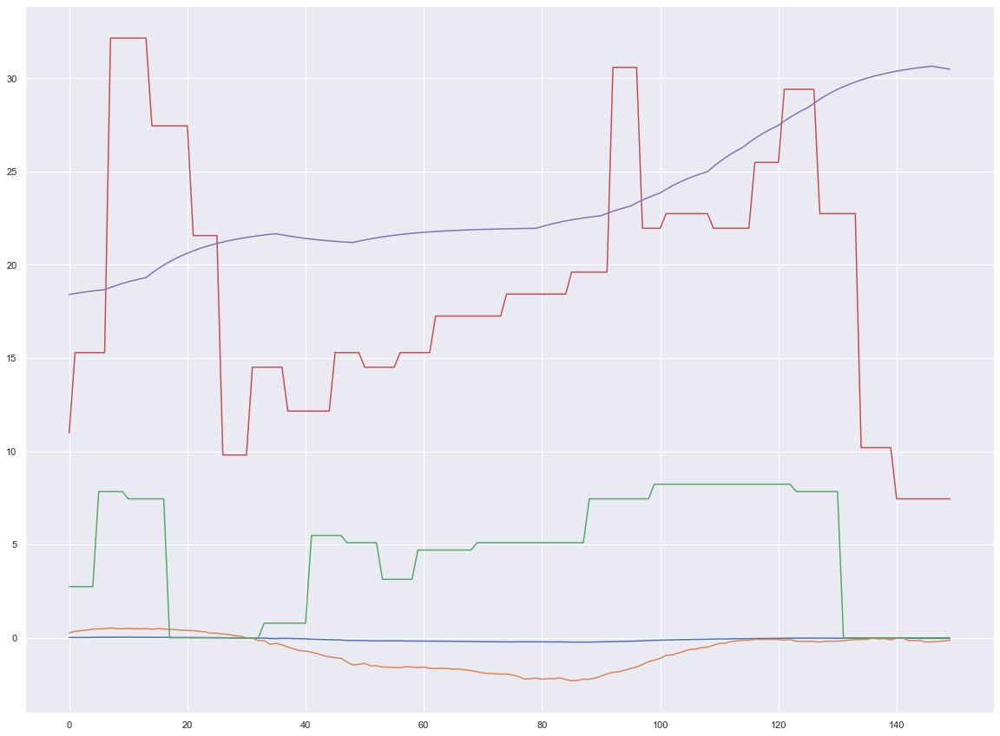

event 1 : class id 1  speed_bumps : class name bumps


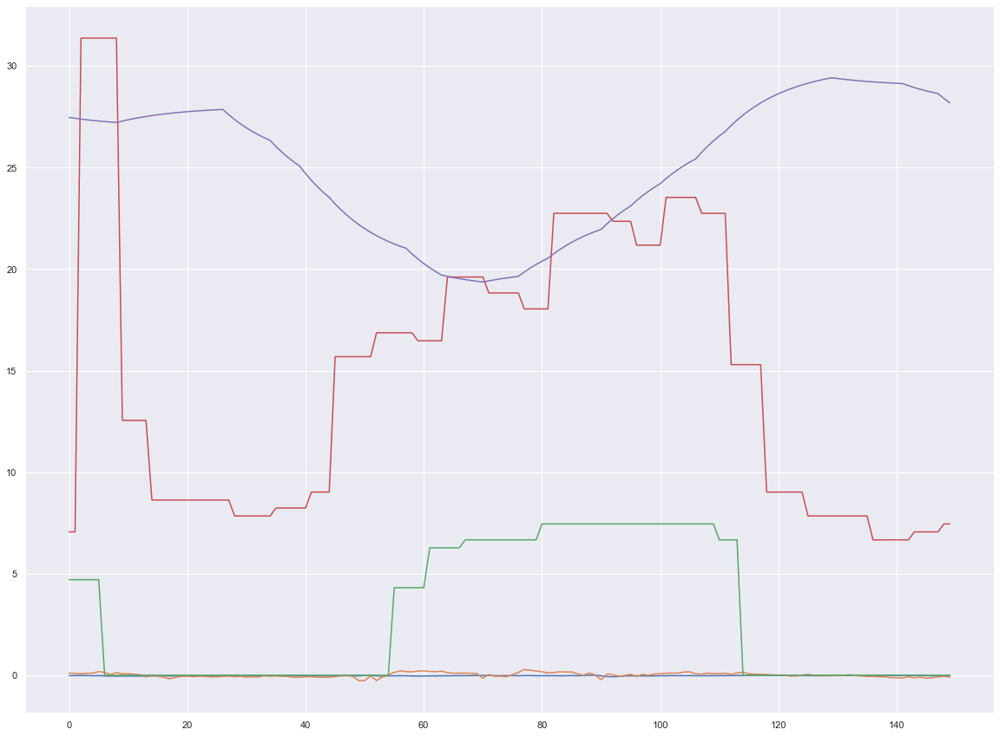

event 2 : class id 2  turning_right_1 : class name right


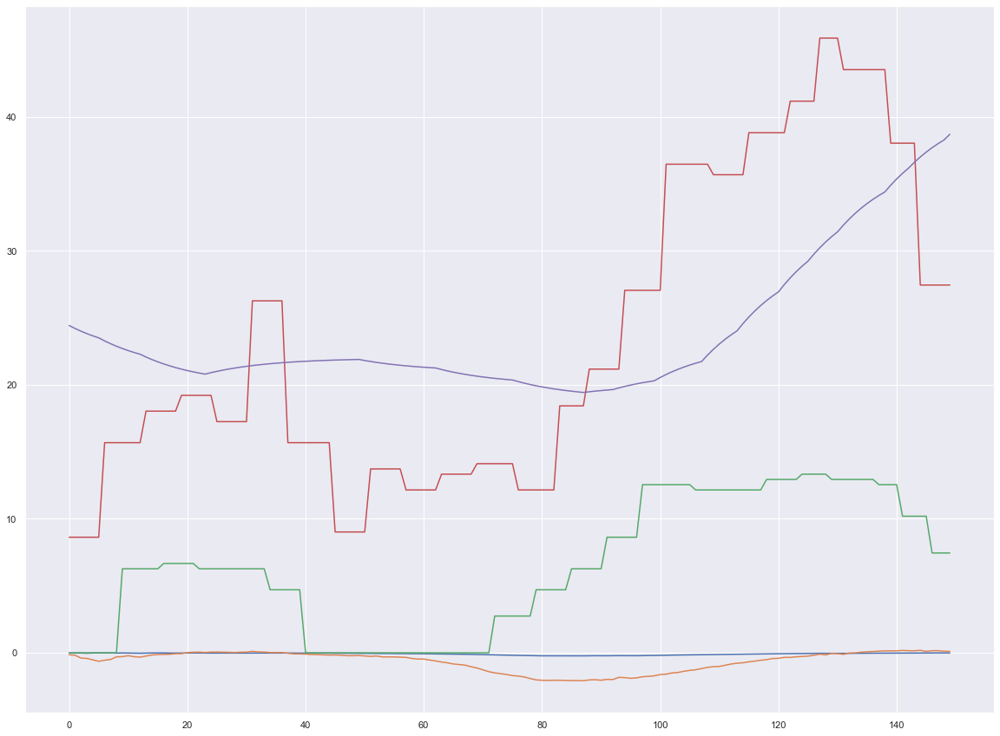

event 3 : class id 2  turning_right_2 : class name right


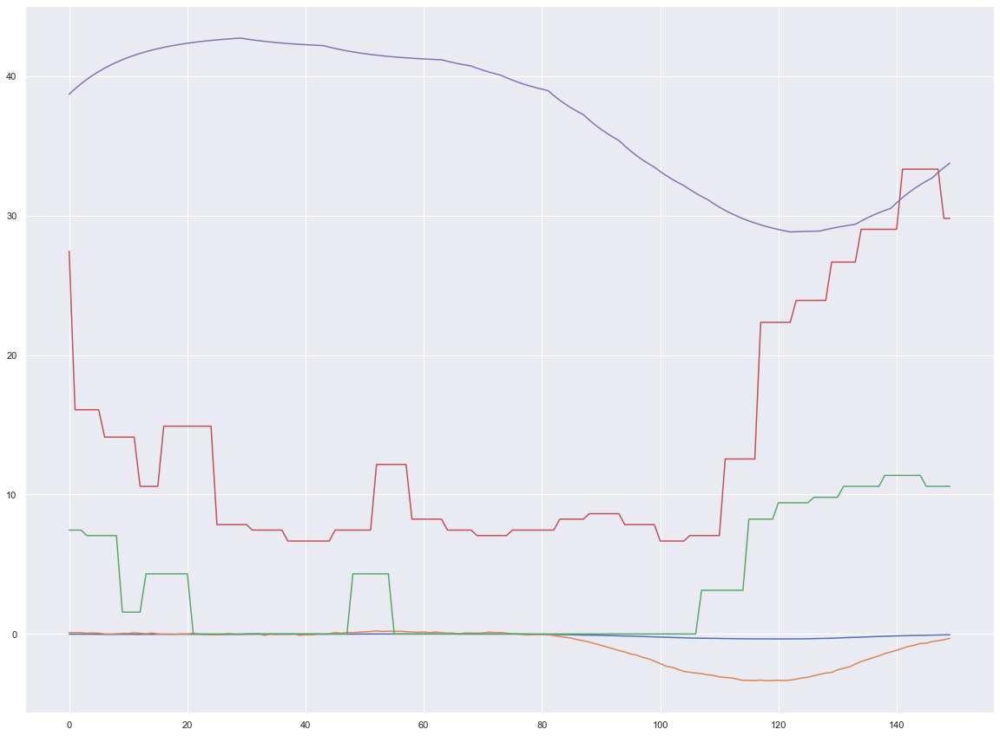

event 4 : class id 3  turning_left_1 : class name left


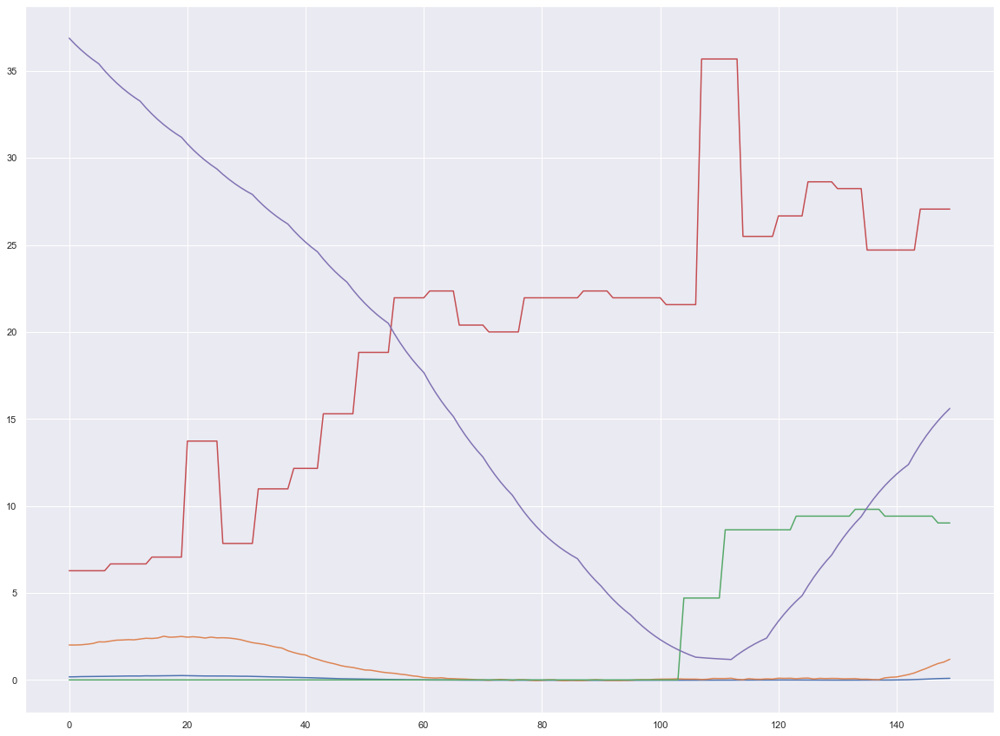

event 5 : class id 4  road_50km_1 : class name 50km


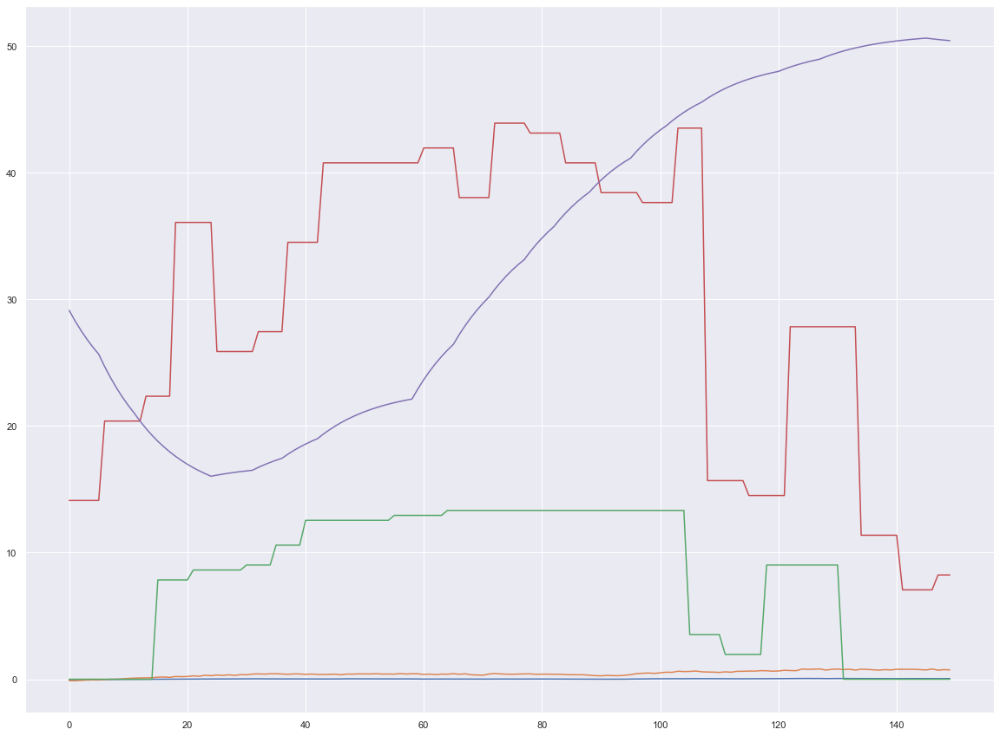

event 6 : class id 6  entering_highway : class name enter


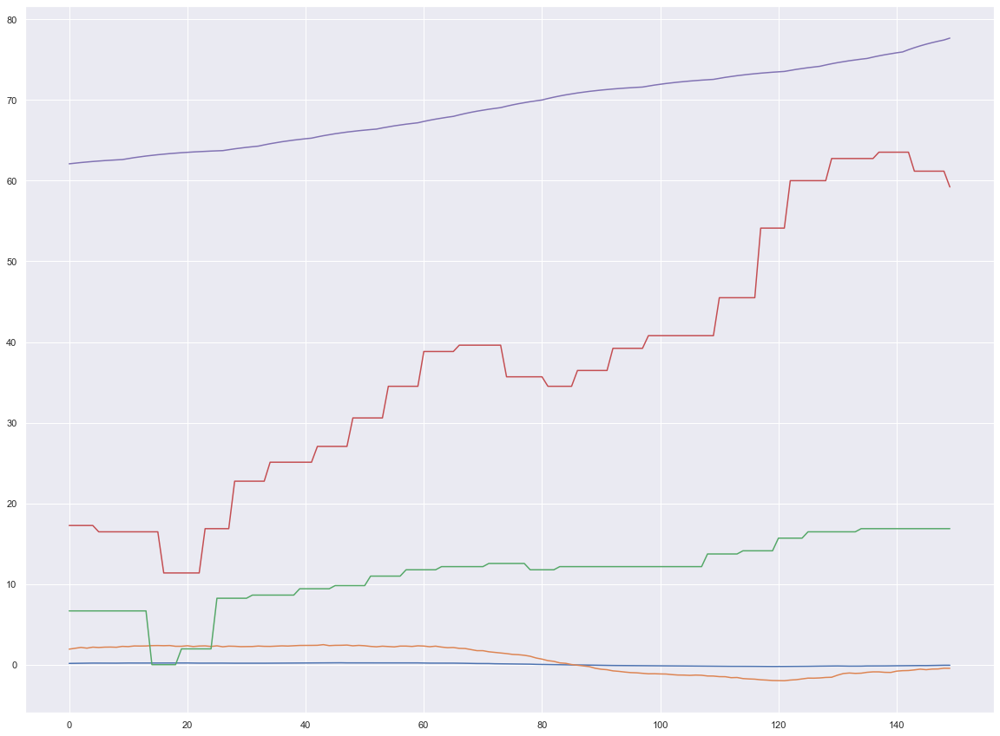

event 7 : class id 5  road_100km : class name 100km


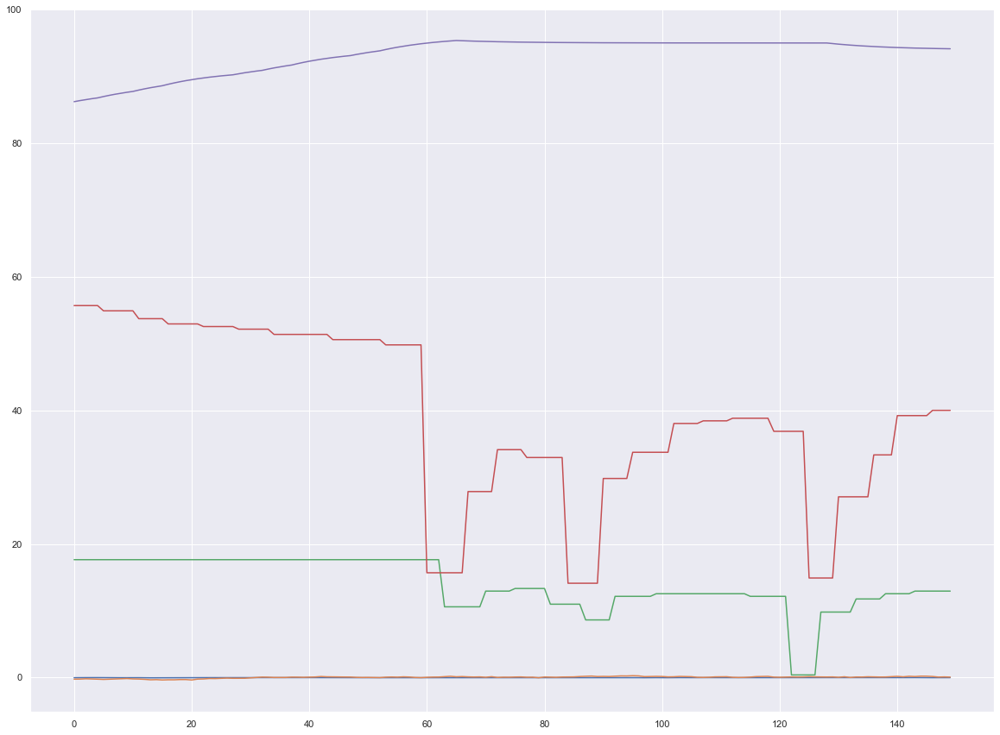

event 8 : class id 7  exiting_highway : class name exit


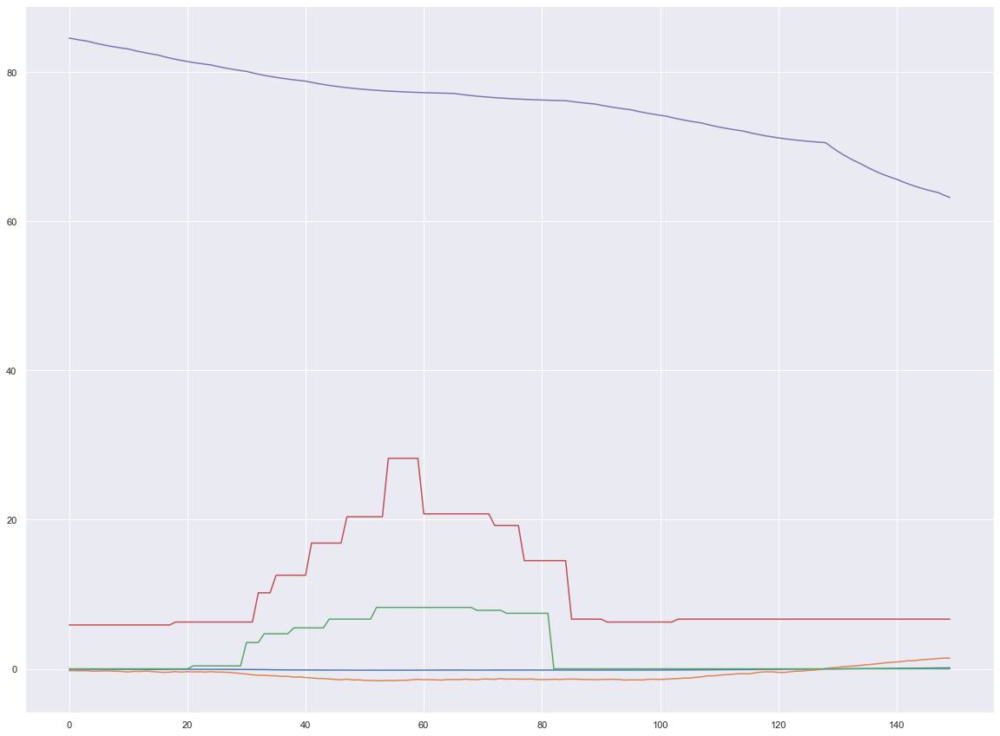

event 9 : class id 4  road_50km_2 : class name 50km


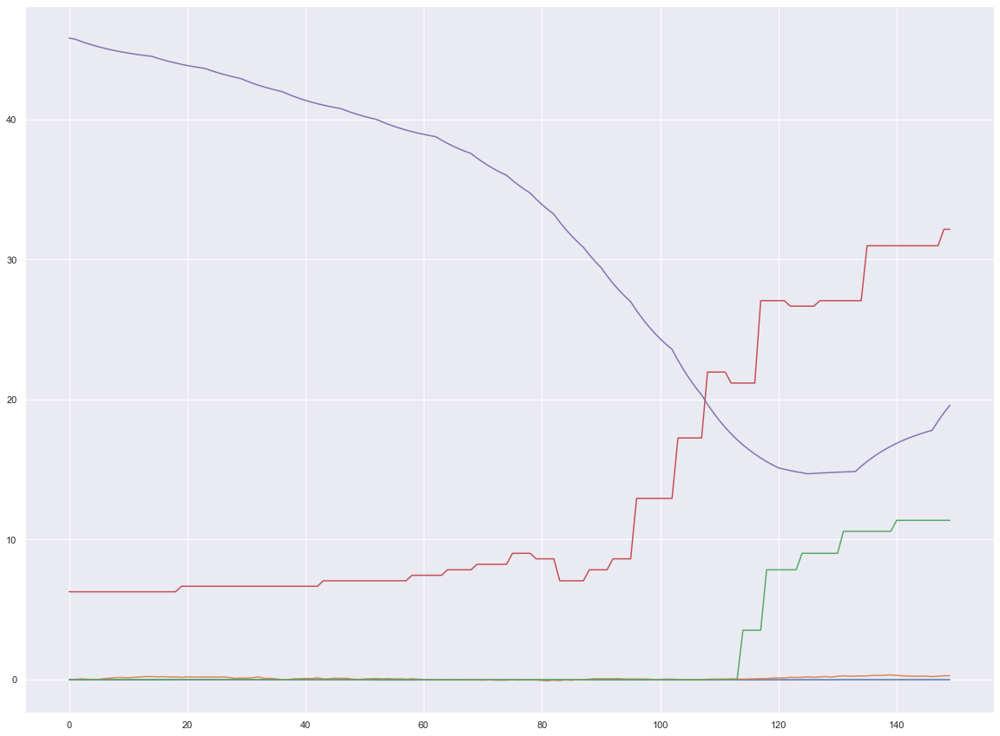

event 10 : class id 3  turning_left_2 : class name left


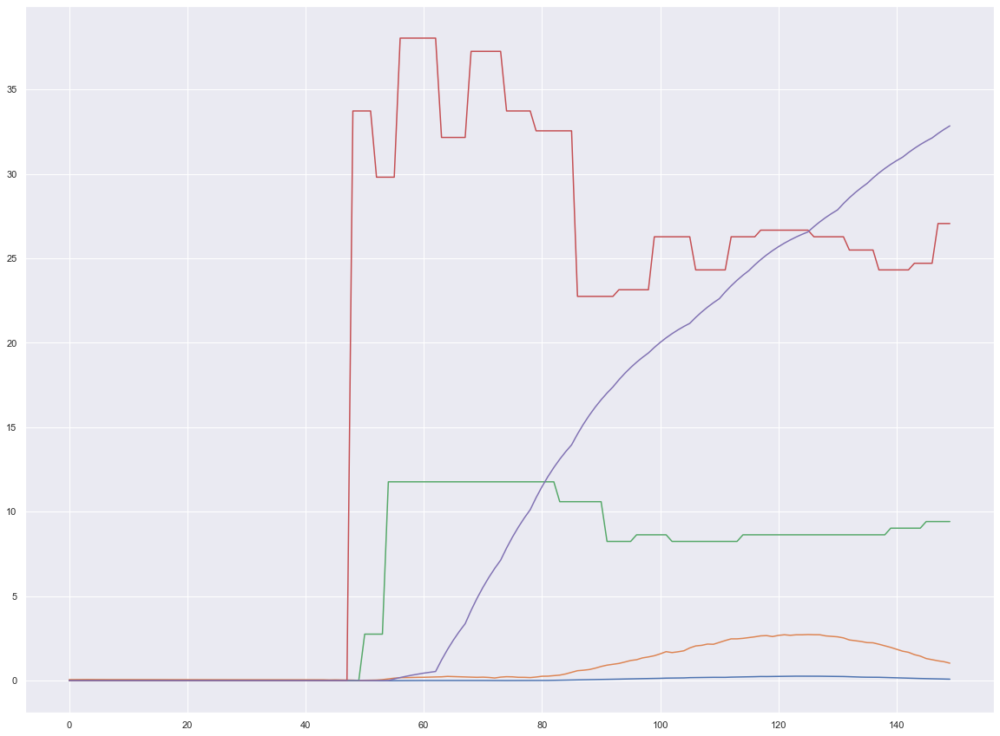

event 11 : class id 0  roundabout_2 : class name round


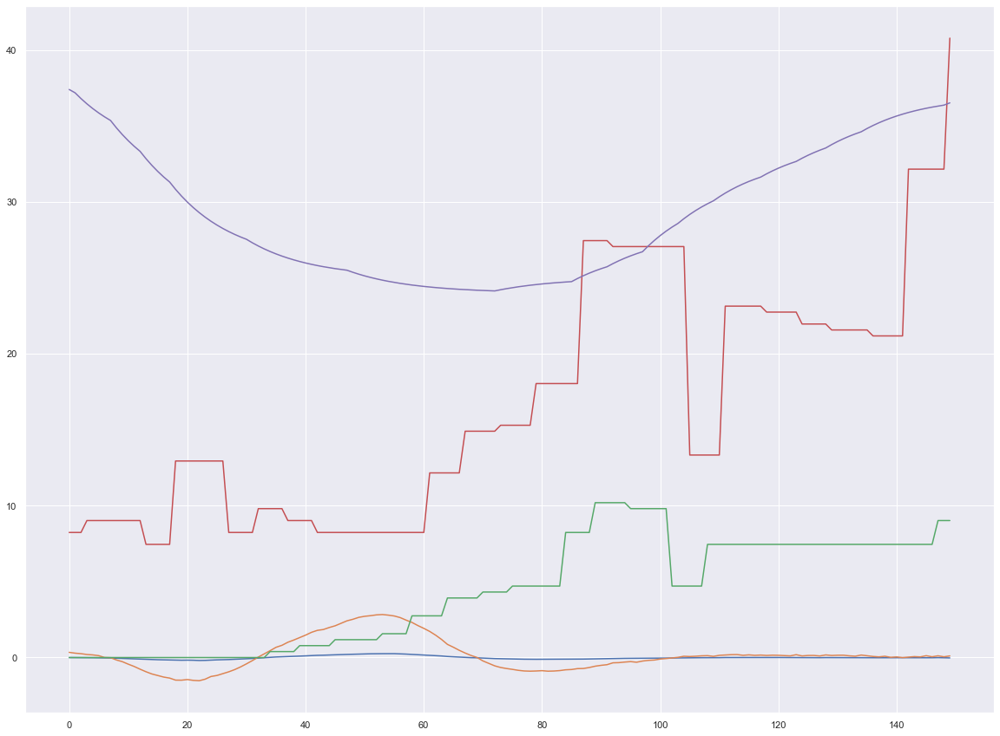

event 12 : class id 0  roundabout_3 : class name round


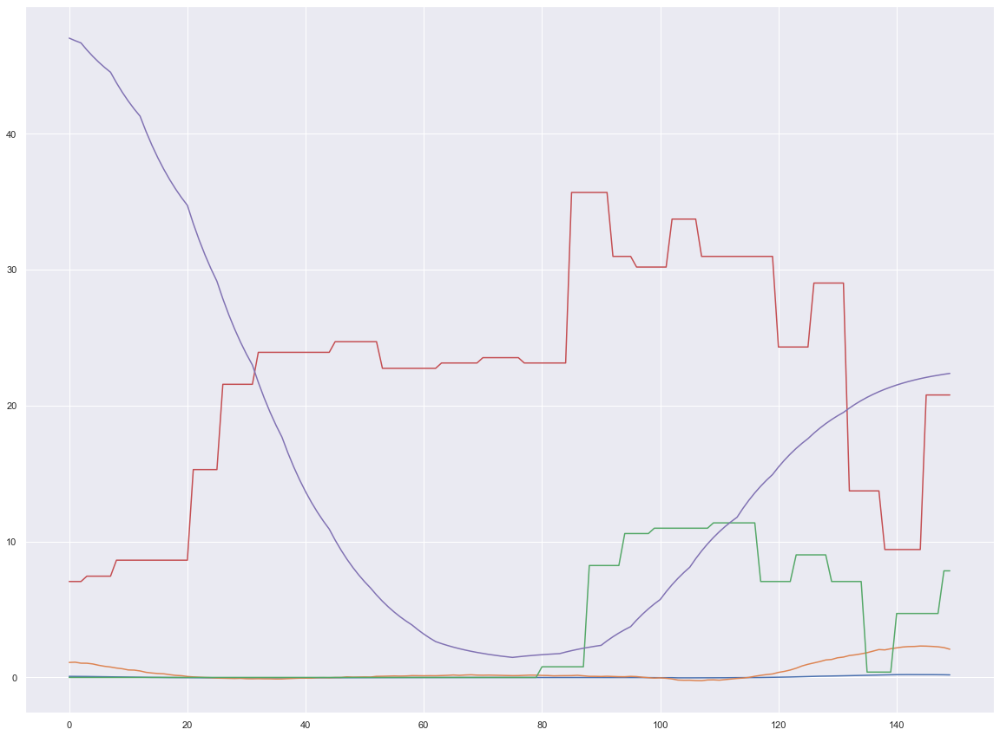

event 13 : class id 2  turning_right_3 : class name right


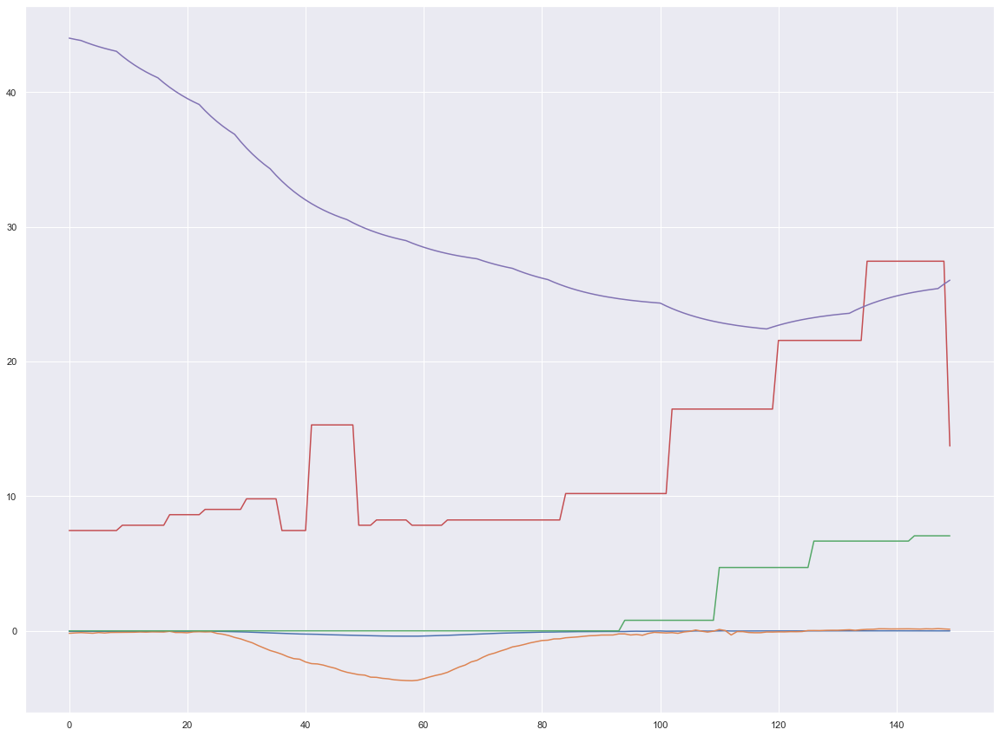

event 14 : class id 0  roundabout_4 : class name round


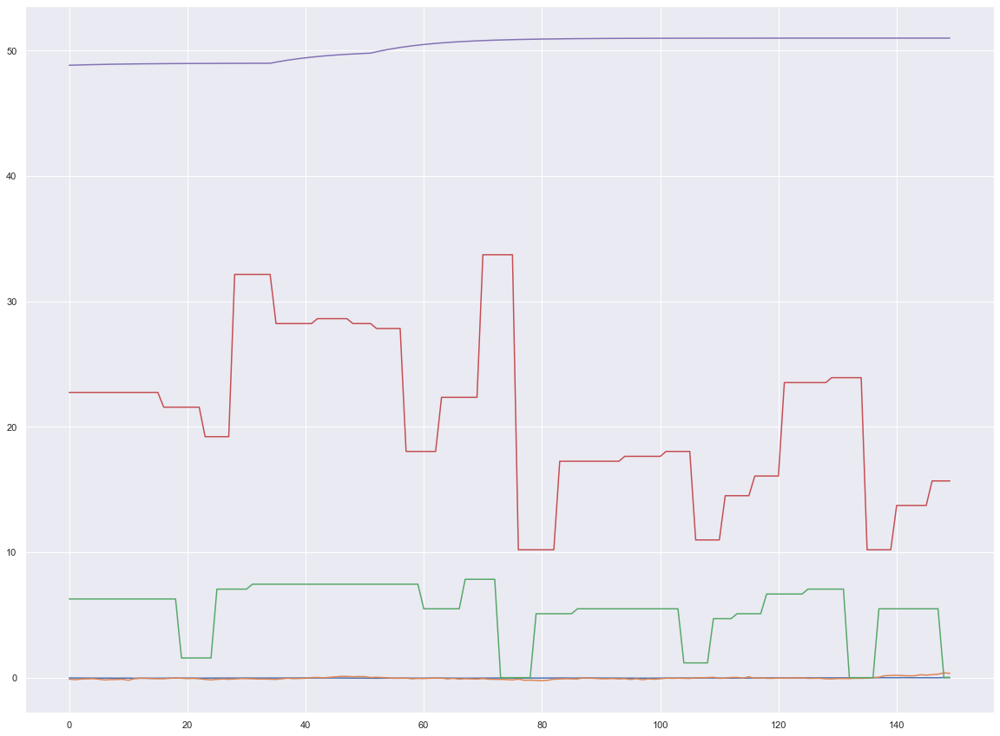

event 15 : class id 4  road_50km_3 : class name 50km


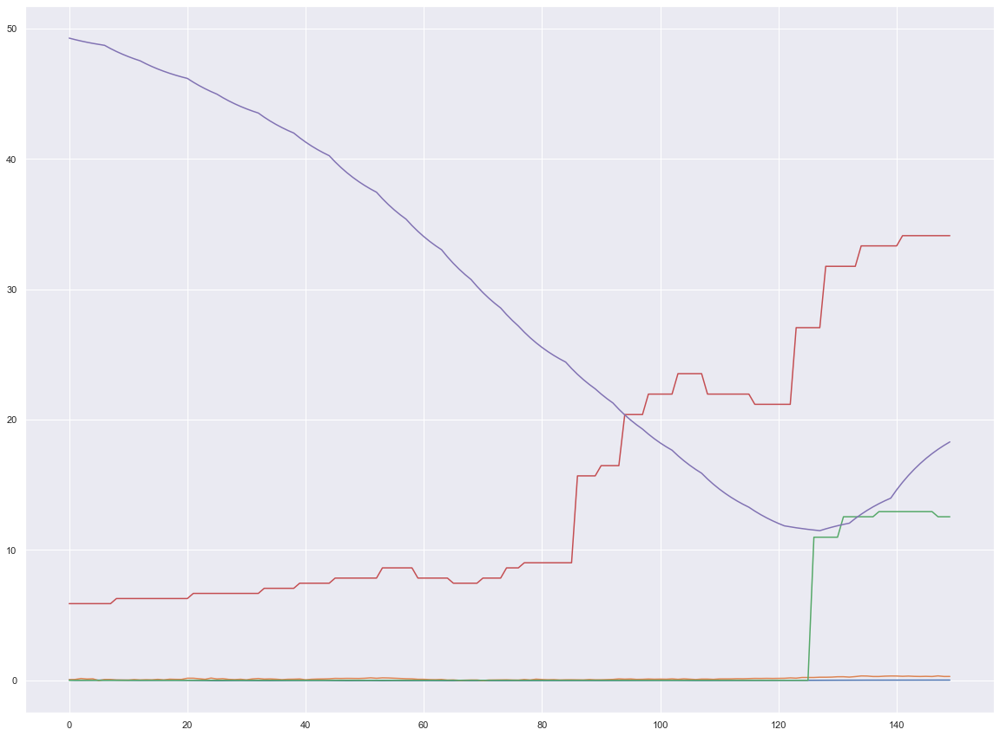

event 16 : class id 4  road_50km_4 : class name 50km


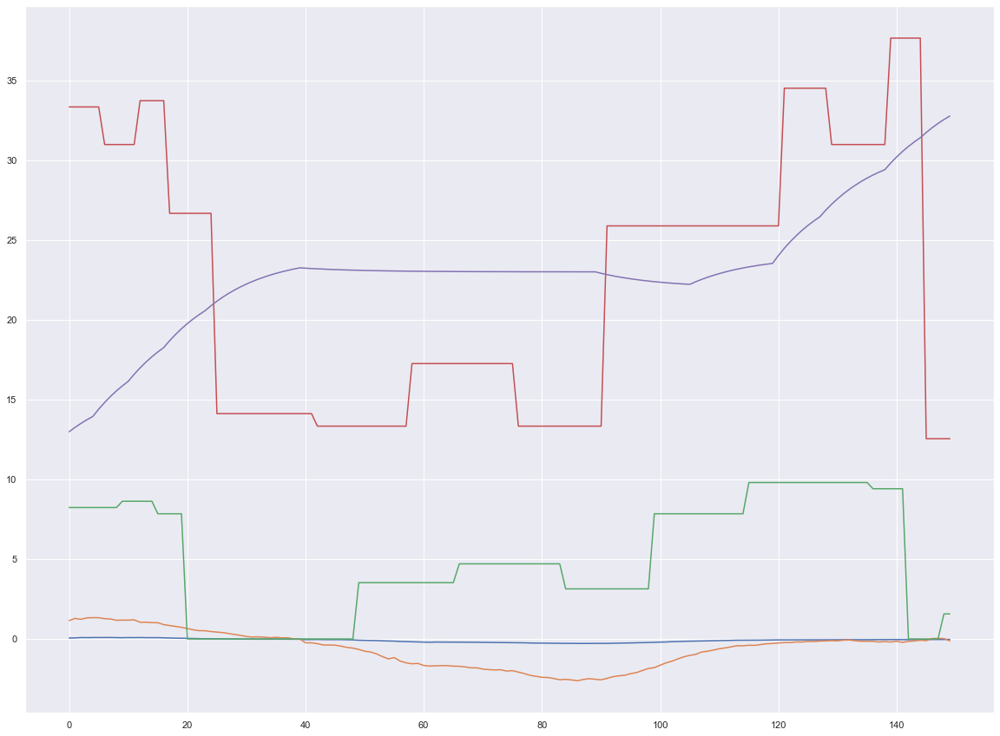

In [31]:
for event in range(len(event_to_class_map)):
    print("event", event, ": class id", event_to_class_map[event], end=" ")
    event_common_name = class_to_event_map[event_to_class_map[event]]
    event_id_name = event_id_to_name_map[event]
    print("", event_id_name, ": class name", event_common_name)
    plt.plot(trainX[event])
    plt.show()

In [32]:
# quickly check out the results when applied over an entire trip
# for the moment do the simplest segmentation possible: just pass
# over the entire trip with an overlapping windowing approach
# in order not too miss too many events which are unaligned with
# the actual manoeuvre

def load_samples_sensors(sample_path):
    sample = pd.read_csv(sample_path, sep=';')
    return sample

def load_preprocessed_samples(sample_path):
    features = [
    ' Device Time', ' Longitude', ' Latitude',
    'Speed (OBD)(km/h)', ' Acceleration Sensor(X axis)(g)', 'Acceleration Sensor(Y axis)(g)',
        ' G(x)', ' G(y)', ' G(z)',
       'Acceleration Sensor(Z axis)(g)', 'Accelerator PedalPosition D(%)',
       'Accelerator PedalPosition E(%)', 'Engine Load(%)', 'Engine Load(Absolute)(%)', 'Engine RPM(rpm)'
    ]
    features_to_rename = {
    ' Device Time':'device_time', ' Longitude':'lon', ' Latitude':'lat',
    'Speed (OBD)(km/h)':'raw_speed_kph', ' Acceleration Sensor(X axis)(g)':'raw_g_x', 'Acceleration Sensor(Y axis)(g)':'raw_g_y',
        ' G(x)':'raw_roll', ' G(y)':'raw_yaw', ' G(z)':'raw_pitch',
       'Acceleration Sensor(Z axis)(g)':'raw_g_z', 'Accelerator PedalPosition D(%)':'apps_d',
       'Accelerator PedalPosition E(%)':'apps_e', 'Engine Load(%)':'engine_load', 'Engine Load(Absolute)(%)':'engine_load_abs',
    'Engine RPM(rpm)':'engine_rpm'
    }
    res = pd.read_csv(filepath_or_buffer=sample_path, sep=',')[features]

    res.rename(columns = features_to_rename, inplace=True)
    res.loc[:,'num_samples'] = np.arange(0,len(res),1) # Index
    res.loc[:,'device_time'] = [dt.strptime(x, '%d-%b-%Y %H:%M:%S.%f') for x in res['device_time']]
    res.loc[:,'cumulative_time'] = [x * 0.1 for x in np.arange(0,len(res),1)]
    res.loc[:,'g_x'] = [x for x in res['raw_g_x'].ewm(com=10).mean()]
    res.loc[:,'g_y'] = [x for x in res['raw_g_y'].ewm(com=10).mean()]
    res.loc[:,'g_z'] = [(x * -1) for x in res['raw_g_z'].ewm(com=10).mean()]
    res.loc[:,'roll'] = [x for x in res['raw_roll'].ewm(com=10).mean()]
    res.loc[:,'yaw'] = [x for x in res['raw_yaw'].ewm(com=10).mean()]
    res.loc[:,'pitch'] = [x for x in res['raw_pitch'].ewm(com=10).mean()]
    res.loc[:,'speed_kph'] = [x for x in res['raw_speed_kph'].ewm(com=10).mean()] # 
    res.loc[:,'apps_d'] = [x - res.loc[0, 'apps_d'] for x in res['apps_d']]
    res.loc[:,'apps_e'] = [x - res.loc[0, 'apps_e'] for x in res['apps_e']]
    return res


In [33]:
# From https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/

# lstm model
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from keras.models import Sequential
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import LSTM
# For ConvLSTM
from keras.layers import ConvLSTM2D
from matplotlib import pyplot
from tensorflow.keras.utils import to_categorical
from keras.layers import Normalization
# to print confusion_matrix:
import tensorflow as tf
import numpy as np
import pandas as pd

MODEL_TYPE = "ConvLSTM"

# Normalize the inputs inside the model
# NOTE: Reliably saving this state with the model seems to need tensorflow version >= 2.8
# For lower versions disable this, or the predictions after a download of the
# model look to be completely off
ENABLE_NORMALIZATION = True
# ENABLE_NORMALIZATION = False

if ENABLE_NORMALIZATION:
    normalizer = Normalization()
    normalizer.adapt(trainX)


# fit and evaluate a model
def evaluate_model(trainX, trainy, testX, testy, save):
        # verbose, epochs, batch_size = 0, 15, 64
        # verbose, epochs, batch_size = 2, 50, 32
        verbose, epochs, batch_size = 2, 100, 32
        n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
        # reshape into subsequences (samples, time steps, rows, cols, channels)
        n_steps, n_length = 3, 50
        trainX = trainX.reshape((trainX.shape[0], n_steps, 1, n_length, n_features))
        testX = testX.reshape((testX.shape[0], n_steps, 1, n_length, n_features))
        # define model
        model = Sequential()
        if ENABLE_NORMALIZATION:
            model.add(Input(shape=(n_steps,1,n_length,n_features)))
            model.add(normalizer)
        model.add(ConvLSTM2D(filters=64, kernel_size=(1,3), activation='relu', input_shape=(n_steps, 1, n_length, n_features)))
        model.add(Dropout(0.5))
        model.add(Flatten())
        model.add(Dense(100, activation='relu'))
        model.add(Dense(n_outputs, activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
        # fit network
        model.fit(trainX, trainy, epochs=epochs, batch_size=batch_size, verbose=verbose)
        # model.fit(trainX, trainy, epochs=epochs, batch_size=batch_size, verbose=verbose, validation_split=0.2)
        # evaluate model
        _, accuracy = model.evaluate(testX, testy, batch_size=batch_size, verbose=0)

        # get and prettyprint confusion_matrix
        y_pred = np.argmax(model.predict(testX),axis=1)
        y_test = np.argmax(testy, axis = 1)
        con_mat = tf.math.confusion_matrix(labels=y_test, predictions=y_pred).numpy()
        con_mat_norm = np.around(con_mat.astype('float') / con_mat.sum(axis=1)[:, np.newaxis], decimals=2)
        if CHECK_AGGRESSIVE:
            classes = ['calm', 'aggr']
        else:
            classes = class_to_event_map  # list(range(n_outputs))
        con_mat_df = pd.DataFrame(con_mat_norm, index = classes, columns = classes)
        print(con_mat_df)
        
        if save:
            model.save('trained_models/lstm-manoeuvre-clf.hdf5')
            global savedModel
            savedModel = model

        return accuracy

# summarize scores
def summarize_results(scores):
        print(scores)
        m, s = mean(scores), std(scores)
        print('Accuracy: %.1f%% (+/-%.1f)' % (m, s))

# run an experiment
def run_experiment(repeats=2):
        # data is already loaded here
        # repeat experiment
        scores = list()
        for r in range(repeats):
                score = evaluate_model(trainX, trainy, testX, testy, r == 0)
                # score = evaluate_model(trainX_normalized, trainy, testX_normalized, testy, r == 0)
                score = score * 100.0
                print('>#%d: %.1f' % (r+1, score))
                scores.append(score)
        # summarize results
        summarize_results(scores)

In [34]:
# run the experiment
run_experiment()

Epoch 1/100
8/8 - 1s - loss: 0.7052 - accuracy: 0.5391 - 1s/epoch - 148ms/step
Epoch 2/100
8/8 - 0s - loss: 0.6612 - accuracy: 0.6016 - 178ms/epoch - 22ms/step
Epoch 3/100
8/8 - 0s - loss: 0.6493 - accuracy: 0.6289 - 169ms/epoch - 21ms/step
Epoch 4/100
8/8 - 0s - loss: 0.6305 - accuracy: 0.6328 - 170ms/epoch - 21ms/step
Epoch 5/100
8/8 - 0s - loss: 0.6127 - accuracy: 0.6602 - 169ms/epoch - 21ms/step
Epoch 6/100
8/8 - 0s - loss: 0.5948 - accuracy: 0.6797 - 171ms/epoch - 21ms/step
Epoch 7/100
8/8 - 0s - loss: 0.5861 - accuracy: 0.6758 - 173ms/epoch - 22ms/step
Epoch 8/100
8/8 - 0s - loss: 0.5788 - accuracy: 0.6797 - 179ms/epoch - 22ms/step
Epoch 9/100
8/8 - 0s - loss: 0.5498 - accuracy: 0.7188 - 171ms/epoch - 21ms/step
Epoch 10/100
8/8 - 0s - loss: 0.5097 - accuracy: 0.7422 - 172ms/epoch - 22ms/step
Epoch 11/100
8/8 - 0s - loss: 0.4843 - accuracy: 0.8320 - 172ms/epoch - 21ms/step
Epoch 12/100
8/8 - 0s - loss: 0.4929 - accuracy: 0.7617 - 175ms/epoch - 22ms/step
Epoch 13/100
8/8 - 0s - los

8/8 - 1s - loss: 0.7252 - accuracy: 0.5273 - 1s/epoch - 159ms/step
Epoch 2/100
8/8 - 0s - loss: 0.6698 - accuracy: 0.6172 - 167ms/epoch - 21ms/step
Epoch 3/100
8/8 - 0s - loss: 0.6580 - accuracy: 0.6016 - 170ms/epoch - 21ms/step
Epoch 4/100
8/8 - 0s - loss: 0.6418 - accuracy: 0.6211 - 178ms/epoch - 22ms/step
Epoch 5/100
8/8 - 0s - loss: 0.6253 - accuracy: 0.6602 - 177ms/epoch - 22ms/step
Epoch 6/100
8/8 - 0s - loss: 0.6190 - accuracy: 0.6484 - 174ms/epoch - 22ms/step
Epoch 7/100
8/8 - 0s - loss: 0.6053 - accuracy: 0.6445 - 177ms/epoch - 22ms/step
Epoch 8/100
8/8 - 0s - loss: 0.5716 - accuracy: 0.7305 - 178ms/epoch - 22ms/step
Epoch 9/100
8/8 - 0s - loss: 0.5582 - accuracy: 0.7266 - 176ms/epoch - 22ms/step
Epoch 10/100
8/8 - 0s - loss: 0.5304 - accuracy: 0.7383 - 182ms/epoch - 23ms/step
Epoch 11/100
8/8 - 0s - loss: 0.5061 - accuracy: 0.7773 - 176ms/epoch - 22ms/step
Epoch 12/100
8/8 - 0s - loss: 0.4595 - accuracy: 0.7656 - 174ms/epoch - 22ms/step
Epoch 13/100
8/8 - 0s - loss: 0.4568 - 

In [36]:
def load_samples_sensors(sample_path):
    sample = pd.read_csv(sample_path, sep=';')
    return sample

# use a test dataset, since it has the sensor names already converted
df_trip = load_preprocessed_samples("./dataset/samples/Sample_1.csv")
df_trip.describe()

idx = 0
event_length = 150
print("using sensors:", sensors)
import tensorflow
model = tensorflow.keras.models.load_model('trained_models/lstm-manoeuvre-clf.hdf5')

total_calm = 0
total_aggr = 0
temp = [] 


while idx + event_length < len(df_trip.index):
    sensorvals_all = df_trip.iloc[idx:idx+event_length]
    values = sensorvals_all.loc[:,sensors].values
    npvalues = np.array(values)
    n_steps = 3
    test_input = np.array([npvalues])
    n_length = int(n_timesteps / n_steps) 
    test_input = test_input.reshape((test_input.shape[0], n_steps, 1, n_length, n_features))
    result = model.predict(test_input)
    pred = np.argmax(result)
    if CHECK_AGGRESSIVE:
        print(idx, pred, ['calm', 'aggr'][pred])
        if pred == 0:
            total_calm += 1
            temp.append((idx,'calm'))
        else:
            total_aggr += 1
            temp.append((idx,'aggr'))
    else:
        print(idx, pred, class_to_event_map[pred])
    idx += int(event_length / 3)

if CHECK_AGGRESSIVE:
    print("calm", total_calm, "aggr", total_aggr)

using sensors: ['g_y', 'yaw', 'apps_d', 'engine_load', 'speed_kph']
0 0 calm
50 0 calm
100 0 calm
150 0 calm
200 0 calm
250 0 calm
300 0 calm
350 0 calm
400 0 calm
450 0 calm
500 0 calm
550 0 calm
600 0 calm
650 0 calm
700 0 calm
750 1 aggr
800 0 calm
850 0 calm
900 1 aggr
950 0 calm
1000 1 aggr
1050 0 calm
1100 0 calm
1150 0 calm
1200 1 aggr
1250 1 aggr
1300 0 calm
1350 0 calm
1400 0 calm
1450 0 calm
1500 0 calm
1550 0 calm
1600 0 calm
1650 0 calm
1700 0 calm
1750 0 calm
1800 0 calm
1850 0 calm
1900 1 aggr
1950 1 aggr
2000 1 aggr
2050 1 aggr
2100 0 calm
2150 0 calm
2200 0 calm
2250 0 calm
2300 0 calm
2350 0 calm
2400 0 calm
2450 0 calm
2500 0 calm
2550 0 calm
2600 0 calm
2650 1 aggr
2700 1 aggr
2750 1 aggr
2800 1 aggr
2850 1 aggr
2900 1 aggr
2950 1 aggr
3000 1 aggr
3050 1 aggr
3100 1 aggr
3150 0 calm
3200 0 calm
3250 1 aggr
3300 1 aggr
3350 1 aggr
3400 0 calm
3450 0 calm
3500 0 calm
3550 0 calm
3600 0 calm
3650 0 calm
3700 0 calm
3750 0 calm
3800 0 calm
3850 0 calm
3900 0 calm
3950 0 

In [37]:
temp

[(0, 'calm'),
 (50, 'calm'),
 (100, 'calm'),
 (150, 'calm'),
 (200, 'calm'),
 (250, 'calm'),
 (300, 'calm'),
 (350, 'calm'),
 (400, 'calm'),
 (450, 'calm'),
 (500, 'calm'),
 (550, 'calm'),
 (600, 'calm'),
 (650, 'calm'),
 (700, 'calm'),
 (750, 'aggr'),
 (800, 'calm'),
 (850, 'calm'),
 (900, 'aggr'),
 (950, 'calm'),
 (1000, 'aggr'),
 (1050, 'calm'),
 (1100, 'calm'),
 (1150, 'calm'),
 (1200, 'aggr'),
 (1250, 'aggr'),
 (1300, 'calm'),
 (1350, 'calm'),
 (1400, 'calm'),
 (1450, 'calm'),
 (1500, 'calm'),
 (1550, 'calm'),
 (1600, 'calm'),
 (1650, 'calm'),
 (1700, 'calm'),
 (1750, 'calm'),
 (1800, 'calm'),
 (1850, 'calm'),
 (1900, 'aggr'),
 (1950, 'aggr'),
 (2000, 'aggr'),
 (2050, 'aggr'),
 (2100, 'calm'),
 (2150, 'calm'),
 (2200, 'calm'),
 (2250, 'calm'),
 (2300, 'calm'),
 (2350, 'calm'),
 (2400, 'calm'),
 (2450, 'calm'),
 (2500, 'calm'),
 (2550, 'calm'),
 (2600, 'calm'),
 (2650, 'aggr'),
 (2700, 'aggr'),
 (2750, 'aggr'),
 (2800, 'aggr'),
 (2850, 'aggr'),
 (2900, 'aggr'),
 (2950, 'aggr'),
 (3

In [38]:
added_val, i, idx, prev_idx = len(sample_1) - temp[len(temp)-1][0], 0, 0, 0
pred_aggressiveness = []

while i != len(temp)-1:
    
#     display(temp[i])
    
    
    if i == 0:
        for j in range(added_val):
            pred_aggressiveness.append(-9999)
#         print(temp[i][0], temp[i+1][0])
        for j in np.arange(temp[i][0], temp[i+1][0], 1):
            pred_aggressiveness.append(temp[i][1])
    else:
#         print(temp[i][0]+1, temp[i+1][0])
        for j in np.arange(temp[i][0]+1, temp[i+1][0], 1):
            pred_aggressiveness.append(temp[i][1])
    # update i
    i += 1
    if i == len(temp) - 1:
        for j in range(len(sample_1)-len(pred_aggressiveness)):
            pred_aggressiveness.append(-9999)
            

In [39]:
pred_aggressiveness

[-9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,
 -9999,


In [40]:
# with CHECK_AGGRESSIVE:
# for a calm driver:
#    calm 121 aggr 25
# for an aggresive driver:
#    calm 34 aggr 92

Manoeuvring classifier

In [41]:
# ConvLSTM with Normalization output:
#
#        round  bumps  right  left  50km  100km  enter  exit
# round   0.00   0.12   0.12  0.38  0.38   0.00   0.00  0.00
# bumps   0.00   0.75   0.00  0.00  0.25   0.00   0.00  0.00
# right   0.00   0.06   0.81  0.06  0.06   0.00   0.00  0.00
# left    0.12   0.00   0.25  0.50  0.00   0.00   0.00  0.12
# 50km    0.06   0.00   0.00  0.06  0.88   0.00   0.00  0.00
# 100km   0.00   0.00   0.25  0.00  0.00   0.75   0.00  0.00
# enter   0.00   0.00   0.00  0.00  0.00   0.25   0.75  0.00
# exit    0.00   0.00   0.00  0.00  0.50   0.25   0.00  0.25
#
# >#1: 64.062

In [42]:
event_to_class_map   = [2,1,2,2,3, 4,6,5,7,4, 3,0,0,2,0, 4,4]
# class_to_event_map = ['roundabout','speedbumps','turning_right','turning_left',\
#                       'road_50km','road_100km','entering_highway',exiting_highway']
class_to_event_map = ['round','bumps','right','left',\
                      '50km','100km','enter','exit']
event_id_to_name_map = ['roundabout_1','speed_bumps','turning_right_1','turning_right_2','turning_left_1',  \
                        'road_50km_1','entering_highway','road_100km','exiting_highway','road_50km_2',  \
                        'turning_left_2','roundabout_2','roundabout_3','turning_right_3','roundabout_4']
# ADDED extr 50km:
event_id_to_name_map = ['roundabout_1','speed_bumps','turning_right_1','turning_right_2','turning_left_1',  \
                        'road_50km_1','entering_highway','road_100km','exiting_highway','road_50km_2',  \
                        'turning_left_2','roundabout_2','roundabout_3','turning_right_3','roundabout_4',\
                        'road_50km_3','road_50km_4']
event_length = 150

CHECK_AGGRESSIVE = False
# CHECK_AGGRESSIVE = True

trainX = []
trainy = []
testX = []
testy = []
for mode in ['calm', 'aggr']:
    print("mode:", mode)
    for trip in range(10):
        print("trip", trip)
        df_trip = pd.read_csv("./dataset/preprocessed/" + mode + "/d" + str(trip + 1), sep=';')
        # print(df_trip.describe())
        for event in range(len(event_to_class_map)):
            print("event", event, ": class id", event_to_class_map[event], end=" ")
            event_common_name = class_to_event_map[event_to_class_map[event]]
            event_id_name = event_id_to_name_map[event]
            print("", event_id_name, ": class name", event_common_name, end=" ")
            if event_id_name == "roundabout_4":
                print("skipped!")
                continue
            if mode == 'calm':
                idx = calm_idxs.iloc[trip][event_id_name]
            else:
                idx = aggr_idxs.iloc[trip][event_id_name]
            print("starts at ", idx)
            # sanity check, avoid truncate event at the end
            if idx + event_length >= len(df_trip.index):
                idx = len(df_trip.index) - event_length
                print("fix idx to", idx, "so it fits length of trip", len(df_trip.index))
            sensorvals_all = df_trip.iloc[idx:idx+event_length]
            sensors = [
                        # sensor values that help identifying manoevres:
                        'g_y',
                        'yaw',
                        'apps_d',
                        'engine_load',
                        'speed_kph',
            ]
            values = sensorvals_all.loc[:,sensors].values
            
            npvalues = np.array(values)
            if CHECK_AGGRESSIVE:
                yval = (mode == 'aggr')
            else:
                yval = event_to_class_map[event]
            if trip < 8:
                trainX.append(npvalues)
                trainy.append(yval)
            else:
                testX.append(npvalues)
                testy.append(yval)

trainX = np.array(trainX)
testX = np.array(testX)
trainy = to_categorical(trainy)
testy = to_categorical(testy)
print(trainX.shape, trainy.shape, testX.shape, testy.shape)

mode: calm
trip 0
event 0 : class id 2  roundabout_1 : class name right starts at  75
event 1 : class id 1  speed_bumps : class name bumps starts at  280
event 2 : class id 2  turning_right_1 : class name right starts at  700
event 3 : class id 2  turning_right_2 : class name right starts at  849
event 4 : class id 3  turning_left_1 : class name left starts at  1100
event 5 : class id 4  road_50km_1 : class name 50km starts at  1400
event 6 : class id 6  entering_highway : class name enter starts at  3200
event 7 : class id 5  road_100km : class name 100km starts at  3400
event 8 : class id 7  exiting_highway : class name exit starts at  3750
event 9 : class id 4  road_50km_2 : class name 50km starts at  4200
event 10 : class id 3  turning_left_2 : class name left starts at  5250
event 11 : class id 0  roundabout_2 : class name round starts at  5600
event 12 : class id 0  roundabout_3 : class name round starts at  6100
event 13 : class id 2  turning_right_3 : class name right starts at

event 12 : class id 0  roundabout_3 : class name round starts at  6050
event 13 : class id 2  turning_right_3 : class name right starts at  6600
event 14 : class id 0  roundabout_4 : class name round skipped!
event 15 : class id 4  road_50km_3 : class name 50km starts at  2000
event 16 : class id 4  road_50km_4 : class name 50km starts at  4490
trip 8
event 0 : class id 2  roundabout_1 : class name right starts at  150
event 1 : class id 1  speed_bumps : class name bumps starts at  334
event 2 : class id 2  turning_right_1 : class name right starts at  750
event 3 : class id 2  turning_right_2 : class name right starts at  950
event 4 : class id 3  turning_left_1 : class name left starts at  1150
event 5 : class id 4  road_50km_1 : class name 50km starts at  1400
event 6 : class id 6  entering_highway : class name enter starts at  3300
event 7 : class id 5  road_100km : class name 100km starts at  3500
event 8 : class id 7  exiting_highway : class name exit starts at  3900
event 9 : cl

event 11 : class id 0  roundabout_2 : class name round starts at  4400
event 12 : class id 0  roundabout_3 : class name round starts at  4850
event 13 : class id 2  turning_right_3 : class name right starts at  5250
event 14 : class id 0  roundabout_4 : class name round skipped!
event 15 : class id 4  road_50km_3 : class name 50km starts at  1900
event 16 : class id 4  road_50km_4 : class name 50km starts at  4100
trip 7
event 0 : class id 2  roundabout_1 : class name right starts at  100
event 1 : class id 1  speed_bumps : class name bumps starts at  243
event 2 : class id 2  turning_right_1 : class name right starts at  725
event 3 : class id 2  turning_right_2 : class name right starts at  900
event 4 : class id 3  turning_left_1 : class name left starts at  1000
event 5 : class id 4  road_50km_1 : class name 50km starts at  1500
event 6 : class id 6  entering_highway : class name enter starts at  3000
event 7 : class id 5  road_100km : class name 100km starts at  3163
event 8 : cla

In [43]:
run_experiment()

Epoch 1/100
8/8 - 1s - loss: 1.8848 - accuracy: 0.3359 - 1s/epoch - 149ms/step
Epoch 2/100
8/8 - 0s - loss: 1.5220 - accuracy: 0.4688 - 172ms/epoch - 21ms/step
Epoch 3/100
8/8 - 0s - loss: 1.3381 - accuracy: 0.5273 - 170ms/epoch - 21ms/step
Epoch 4/100
8/8 - 0s - loss: 1.2206 - accuracy: 0.5781 - 162ms/epoch - 20ms/step
Epoch 5/100
8/8 - 0s - loss: 1.1299 - accuracy: 0.5977 - 166ms/epoch - 21ms/step
Epoch 6/100
8/8 - 0s - loss: 1.0721 - accuracy: 0.6602 - 170ms/epoch - 21ms/step
Epoch 7/100
8/8 - 0s - loss: 1.0277 - accuracy: 0.6367 - 166ms/epoch - 21ms/step
Epoch 8/100
8/8 - 0s - loss: 0.9736 - accuracy: 0.6562 - 165ms/epoch - 21ms/step
Epoch 9/100
8/8 - 0s - loss: 0.9205 - accuracy: 0.6719 - 171ms/epoch - 21ms/step
Epoch 10/100
8/8 - 0s - loss: 0.8492 - accuracy: 0.7070 - 165ms/epoch - 21ms/step
Epoch 11/100
8/8 - 0s - loss: 0.8015 - accuracy: 0.7031 - 171ms/epoch - 21ms/step
Epoch 12/100
8/8 - 0s - loss: 0.7747 - accuracy: 0.7344 - 165ms/epoch - 21ms/step
Epoch 13/100
8/8 - 0s - los

8/8 - 1s - loss: 1.8427 - accuracy: 0.3828 - 1s/epoch - 139ms/step
Epoch 2/100
8/8 - 0s - loss: 1.4496 - accuracy: 0.5156 - 152ms/epoch - 19ms/step
Epoch 3/100
8/8 - 0s - loss: 1.3099 - accuracy: 0.5156 - 180ms/epoch - 23ms/step
Epoch 4/100
8/8 - 0s - loss: 1.1915 - accuracy: 0.5938 - 149ms/epoch - 19ms/step
Epoch 5/100
8/8 - 0s - loss: 1.1200 - accuracy: 0.6328 - 147ms/epoch - 18ms/step
Epoch 6/100
8/8 - 0s - loss: 1.0472 - accuracy: 0.6133 - 163ms/epoch - 20ms/step
Epoch 7/100
8/8 - 0s - loss: 0.9855 - accuracy: 0.6758 - 202ms/epoch - 25ms/step
Epoch 8/100
8/8 - 0s - loss: 0.8906 - accuracy: 0.7031 - 159ms/epoch - 20ms/step
Epoch 9/100
8/8 - 0s - loss: 0.8668 - accuracy: 0.6992 - 150ms/epoch - 19ms/step
Epoch 10/100
8/8 - 0s - loss: 0.8236 - accuracy: 0.7148 - 150ms/epoch - 19ms/step
Epoch 11/100
8/8 - 0s - loss: 0.7682 - accuracy: 0.7305 - 148ms/epoch - 19ms/step
Epoch 12/100
8/8 - 0s - loss: 0.7125 - accuracy: 0.7773 - 150ms/epoch - 19ms/step
Epoch 13/100
8/8 - 0s - loss: 0.7212 - 

In [44]:
# use a test dataset, since it has the sensor names already converted
df_trip = load_preprocessed_samples("./dataset/samples/Sample_1.csv")

idx = 0
event_length = 150
print("using sensors:", sensors)
import tensorflow
model = tensorflow.keras.models.load_model('trained_models/lstm-manoeuvre-clf.hdf5')

total_calm = 0
total_aggr = 0
CHECK_AGGRESSIVE = False

temp = [] 

while idx + event_length < len(df_trip.index):
    sensorvals_all = df_trip.iloc[idx:idx+event_length]
    values = sensorvals_all.loc[:,sensors].values
    npvalues = np.array(values)
    # print("idx", idx, ":", npvalues.shape, end=" ")
    test_input = np.array([npvalues])
    n_timesteps, n_features = test_input.shape[1], test_input.shape[2]
    n_steps = 3
    n_length = int(n_timesteps / n_steps) 
    test_input = test_input.reshape((test_input.shape[0], n_steps, 1, n_length, n_features))
    result = model.predict(test_input)
    # print("result", result.shape, result)
    pred = np.argmax(result)
    # print("pred class", pred)
    if CHECK_AGGRESSIVE:
        print(idx, pred, ['calm', 'aggr'][pred])
        if pred == 0:
            total_calm += 1
        else:
            total_aggr += 1
    else:
        print(idx, pred, class_to_event_map[pred])
        temp.append((idx, class_to_event_map[pred]))
    idx += int(event_length / 3)
    
if CHECK_AGGRESSIVE:
    print("calm", total_calm, "aggr", total_aggr)

using sensors: ['g_y', 'yaw', 'apps_d', 'engine_load', 'speed_kph']
0 2 right
50 2 right
100 2 right
150 2 right
200 2 right
250 1 bumps
300 1 bumps
350 1 bumps
400 1 bumps
450 1 bumps
500 1 bumps
550 1 bumps
600 1 bumps
650 1 bumps
700 1 bumps
750 2 right
800 2 right
850 2 right
900 2 right
950 2 right
1000 2 right
1050 2 right
1100 3 left
1150 3 left
1200 3 left
1250 3 left
1300 4 50km
1350 4 50km
1400 4 50km
1450 1 bumps
1500 2 right
1550 3 left
1600 3 left
1650 3 left
1700 4 50km
1750 4 50km
1800 0 round
1850 0 round
1900 0 round
1950 4 50km
2000 4 50km
2050 4 50km
2100 4 50km
2150 4 50km
2200 3 left
2250 4 50km
2300 0 round
2350 4 50km
2400 4 50km
2450 4 50km
2500 4 50km
2550 4 50km
2600 4 50km
2650 4 50km
2700 4 50km
2750 4 50km
2800 4 50km
2850 4 50km
2900 4 50km
2950 4 50km
3000 4 50km
3050 6 enter
3100 6 enter
3150 6 enter
3200 4 50km
3250 4 50km
3300 4 50km
3350 4 50km
3400 4 50km
3450 4 50km
3500 3 left
3550 6 enter
3600 6 enter
3650 6 enter
3700 5 100km
3750 5 100km
3800 5 

In [45]:
added_val, i, idx, prev_idx = len(sample_1) - temp[len(temp)-1][0], 0, 0, 0
pred_classification_list = []

while i != len(temp)-1:
    
#     display(temp[i])
    
    
    if i == 0:
        for j in range(added_val):
            pred_classification_list.append(-9999)
#         print(temp[i][0], temp[i+1][0])
        for j in np.arange(temp[i][0], temp[i+1][0], 1):
            pred_classification_list.append(temp[i][1])
    else:
#         print(temp[i][0]+1, temp[i+1][0])
        for j in np.arange(temp[i][0]+1, temp[i+1][0], 1):
            pred_classification_list.append(temp[i][1])
    # update i
    i += 1
    if i == len(temp) - 1:
        for j in range(len(sample_1)-len(pred_classification_list)):
            pred_classification_list.append(-9999)
            

In [46]:
len(pred_aggressiveness), len(pred_classification_list) 

(8238, 8238)

In [47]:
sample_1['Predicts'] =[x for x in zip(pred_aggressiveness, pred_classification_list)]

In [48]:
fig = px.scatter_mapbox(sample_1[[' Latitude', ' Longitude', 'Predicts']], lat=' Latitude', lon=' Longitude', hover_name='Predicts', color='Predicts', zoom=12, height=500)
fig.update_layout(
    mapbox_style='carto-positron'
)
fig.show()

In [49]:
sample_1['Predicts'].unique()

array([(-9999, -9999), ('calm', 'right'), ('calm', 'bumps'),
       ('aggr', 'right'), ('calm', 'left'), ('aggr', 'left'),
       ('calm', '50km'), ('calm', 'round'), ('aggr', 'round'),
       ('aggr', '50km'), ('aggr', 'enter'), ('calm', 'enter'),
       ('calm', '100km'), ('aggr', 'exit'), ('calm', 'exit')],
      dtype=object)